In [1]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Object masks in images from prompts with SAM 2


Segment Anything Model 2 (SAM 2) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt.

The `SAM2ImagePredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.


<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/image_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>


## Environment Set-up


If running locally using jupyter, first install `sam2` in your environment using the [installation instructions](https://github.com/facebookresearch/sam2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).


In [2]:
using_colab = False

In [4]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/groceries.jpg

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

## Set-up


Necessary imports and helper functions for displaying points, boxes, and masks.


In [5]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [6]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [15]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])   # light blue
        #color = np.array([1.0, 0.0, 0.0, 0.6])  # red
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        print(f"Mask shape: {mask.shape}")
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

## Example image


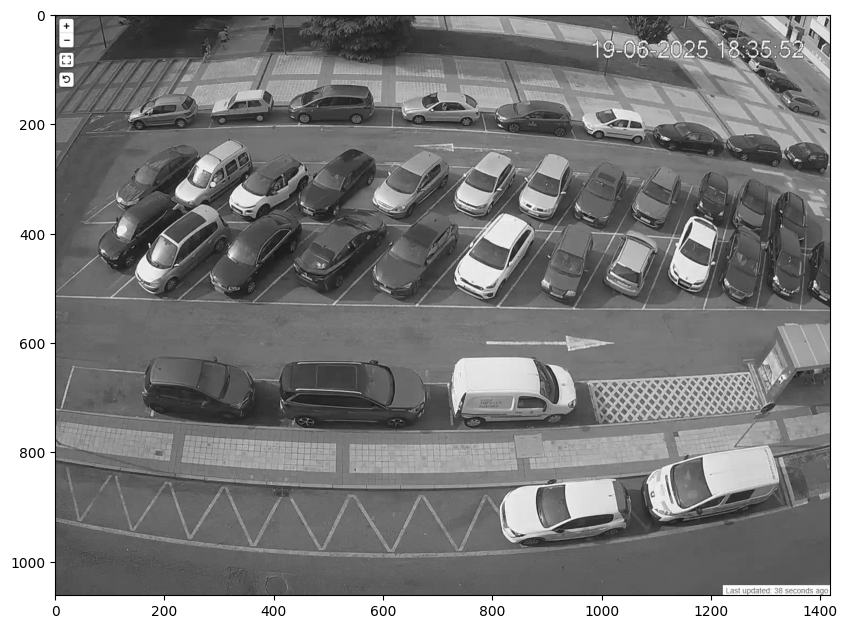

In [ ]:
image = Image.open('parquery/frame_60700.jpg')
image = np.array(image.convert("L"))  # Convert to grayscale
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
plt.axis('on')
plt.show()

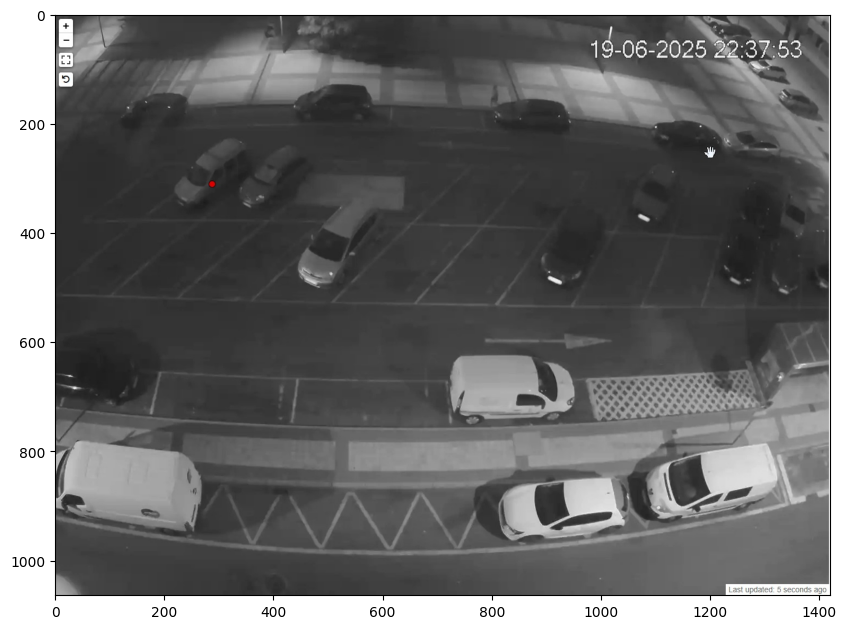

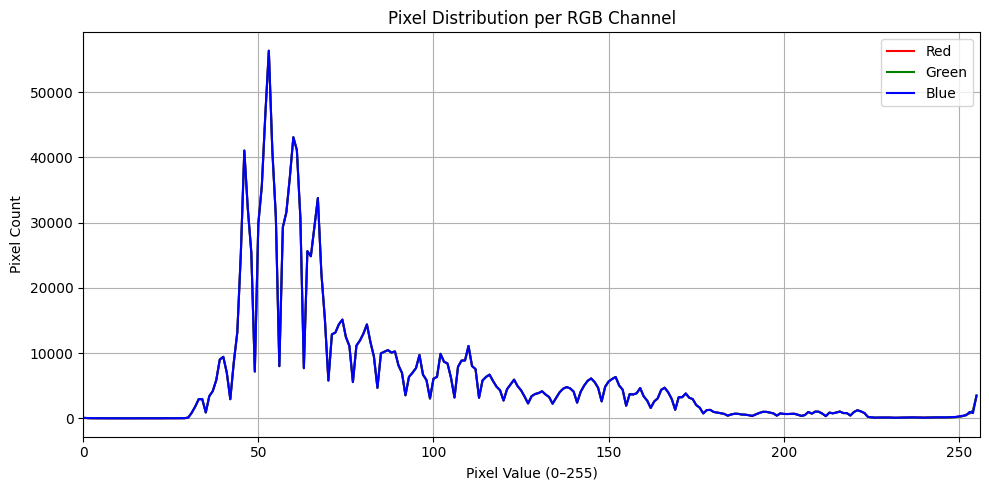

In [72]:
import cv2
from collections import Counter

image = Image.open('parquery/frame_200000.jpg')
#image = Image.open('parquery/frame_00000.jpg')
image_np = np.array(image.convert("RGB"))
image = np.array(image.convert("RGB"))

plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('on')
plt.show()

colors = ('r', 'g', 'b')
channel_names = ('Red', 'Green', 'Blue')

plt.figure(figsize=(10, 5))
for i, color in enumerate(colors):
    hist = cv2.calcHist([image_np], [i], None, [256], [0, 256])
    plt.plot(hist, color=color, label=channel_names[i])
    plt.xlim([0, 256])

plt.title("Pixel Distribution per RGB Channel")
plt.xlabel("Pixel Value (0–255)")
plt.ylabel("Pixel Count")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Selecting objects with SAM 2


First, load the SAM 2 model and predictor. Change the path below to point to the SAM 2 checkpoint. Running on CUDA and using the default model are recommended for best results.


In [12]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "../checkpoints/sam2_hiera_large.pt"
model_cfg = "../sam2/configs/sam2/sam2_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

Process the image to produce an image embedding by calling `SAM2ImagePredictor.set_image`. `SAM2ImagePredictor` remembers this embedding and will use it for subsequent mask prediction.


In [16]:
gray_rgb = np.stack([image, image, image], axis=-1).astype(np.uint8)
predictor.set_image(gray_rgb)

In [73]:

predictor.set_image(image)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.


In [59]:
input_points = np.array([
    [206, 182],  #A1 0
    [356, 175],  #A2 1
    [528, 177],  #A3 2
    [711, 183],  #A4 3
    [882, 200],  #A5 4
    [1033, 213], #A6 5
    [1174, 242], #A7 6
    [1270, 250], #A8 7
    [1380, 270], #A9 8

    [173, 296],  #B1 9
    [289, 297],  #B2 10
    [389, 297],  #B3 11 
    [487, 326],  #B4 12 
    [644, 309],  #B5 13
    [780, 315],  #B6 14
    [903, 315],  #B7 15
    [987, 351],  #B8 16
    [1100, 340], #B9 17
    [1206, 340], #B10 18
    [1278, 356], #B11 19
    [1350, 363], #B12 20

    [124, 418],  #C1 21
    [241, 416],  #C2 22
    [377, 424],  #C3 23
    [521, 433],  #C4 24
    [664, 438],  #C5 25
    [803, 435],  #C6 26
    [942, 445],  #C7 27
    [1058, 459], #C8 28
    [1158, 470], #C9 29
    [1260, 462], #C10 30
    [1340, 468], #C11 31
    [1403, 470], #C12 32

    [101, 687],  #D1 33
    [284, 670],  #D2 34
    [559, 685],  #D3 35
    [817, 679],  #D4 36
])
input_label = np.array([1])

In [22]:
print(predictor._features["image_embed"].shape, predictor._features["image_embed"][-1].shape)

torch.Size([1, 256, 64, 64]) torch.Size([256, 64, 64])


Predict with `SAM2ImagePredictor.predict`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.


첫 번째 마스크의 픽셀 개수: 5901
첫 번째 마스크의 픽셀 개수: 5901.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 344 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 332 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 328 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 325 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 321 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 295 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 273 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 240 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 223 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 202 픽셀
idx: 1, [O] Occupied Count: 1, Empty Count: 0, slot=A1, Score=0.852, width=124, height=67
idx: 1, [O] Occupied Count: 1, Empty Count: 0, 색상수=96, 채도편차=0.00, 비율=1.85


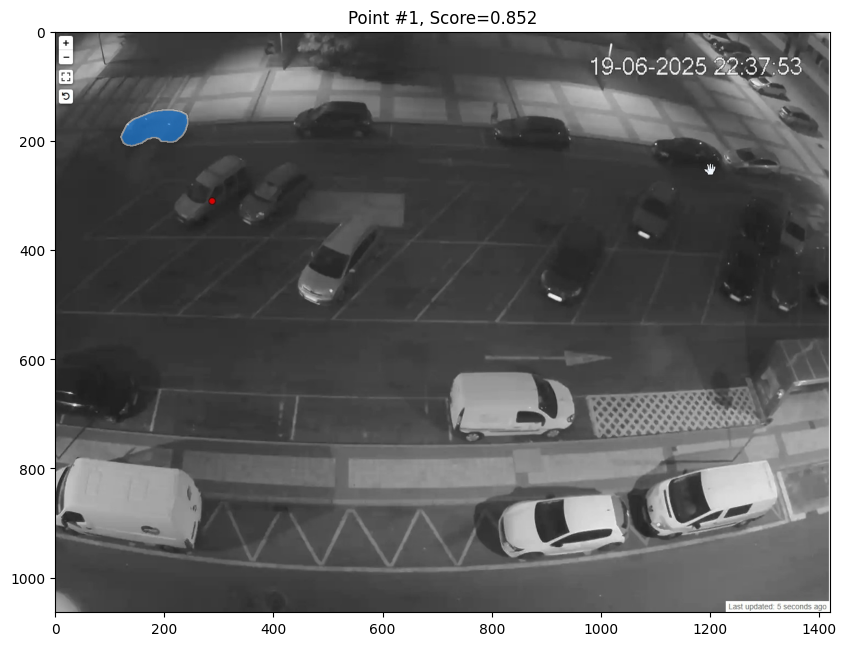

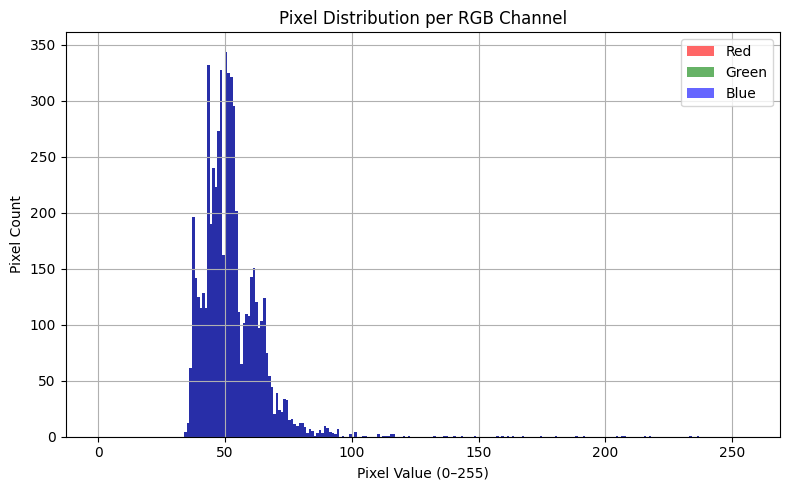

첫 번째 마스크의 픽셀 개수: 41498
첫 번째 마스크의 픽셀 개수: 41498.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 6212 픽셀
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 5579 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 3753 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 3211 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 2909 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 2713 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 2549 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 2212 픽셀
색상 (np.uint8(57), np.uint8(57), np.uint8(57)) → 1767 픽셀
색상 (np.uint8(55), np.uint8(55), np.uint8(55)) → 1582 픽셀
idx: 2, [X] Occupied Count: 1, Empty Count: 1, slot=A2, Score=0.486, width=1023, height=104, 색상수=38, 채도편차=0.00, 비율=9.84


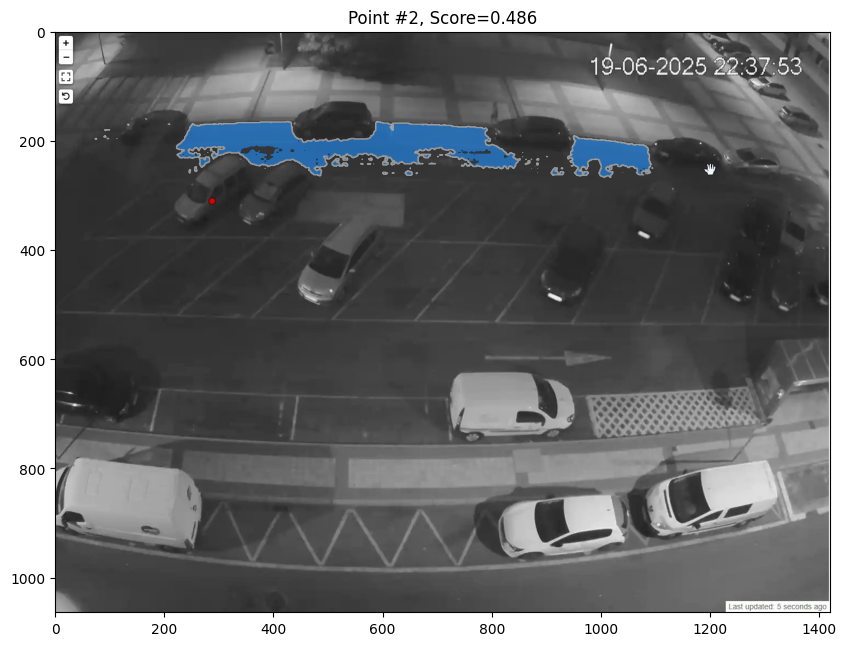

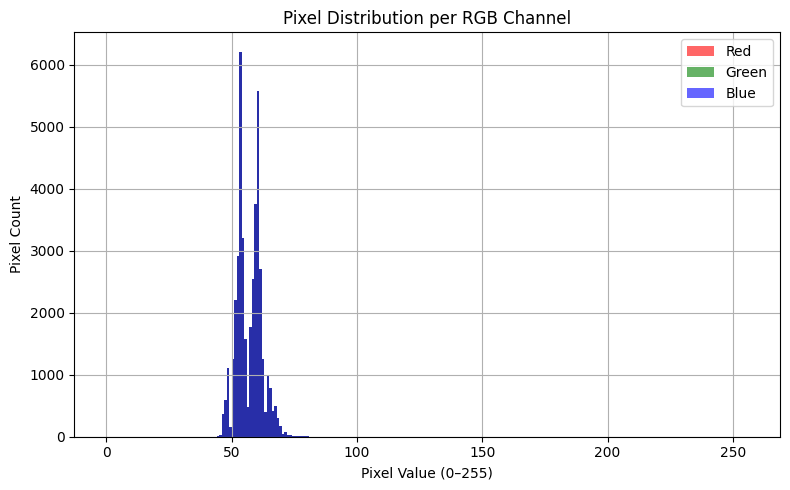

첫 번째 마스크의 픽셀 개수: 8430
첫 번째 마스크의 픽셀 개수: 8430.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 1247 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 764 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 645 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 621 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 615 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 571 픽셀
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 359 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 351 픽셀
색상 (np.uint8(42), np.uint8(42), np.uint8(42)) → 266 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 184 픽셀
idx: 3, [O] Occupied Count: 2, Empty Count: 1, slot=A3, Score=0.941, width=146, height=68
idx: 3, [O] Occupied Count: 2, Empty Count: 1, 색상수=90, 채도편차=0.00, 비율=2.15


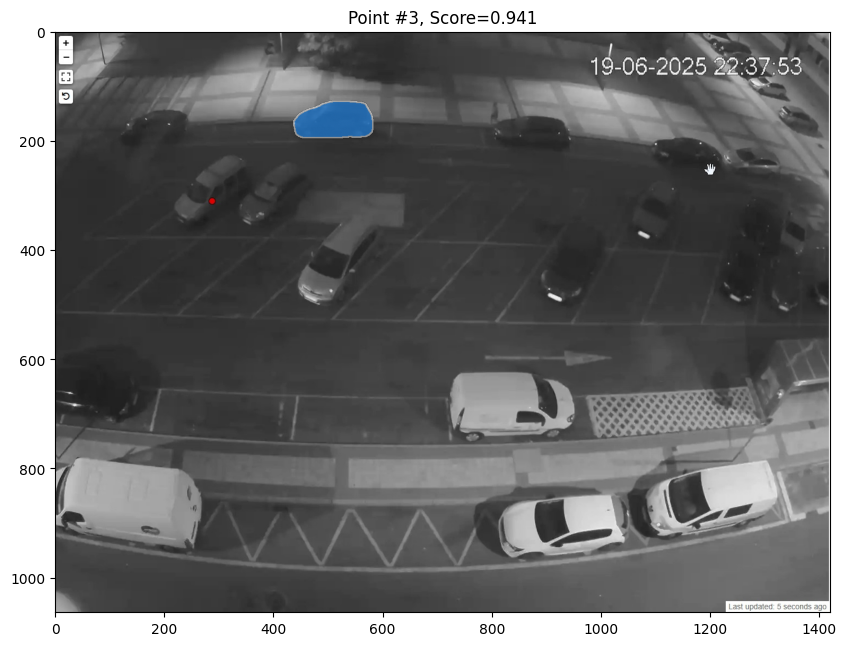

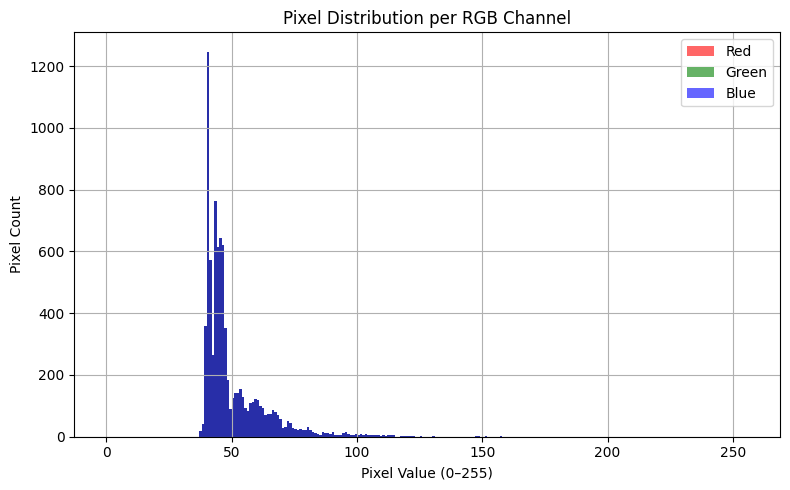

첫 번째 마스크의 픽셀 개수: 43161
첫 번째 마스크의 픽셀 개수: 43161.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 5834 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 5573 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 3973 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 3756 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 2858 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 2732 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 2543 픽셀
색상 (np.uint8(55), np.uint8(55), np.uint8(55)) → 2171 픽셀
색상 (np.uint8(57), np.uint8(57), np.uint8(57)) → 2102 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 1957 픽셀
idx: 4, [X] Occupied Count: 2, Empty Count: 2, slot=A4, Score=0.389, width=1093, height=101, 색상수=40, 채도편차=0.00, 비율=10.82


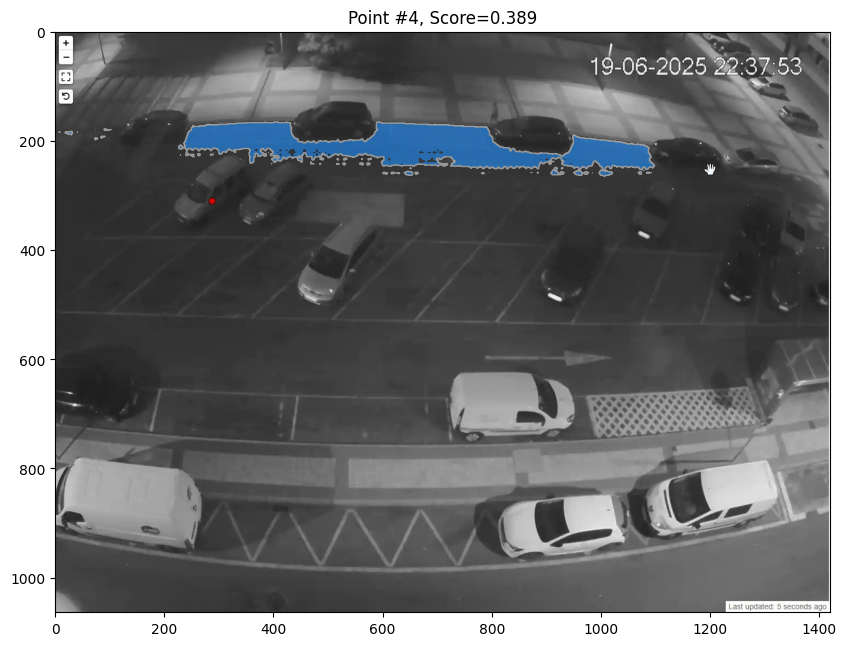

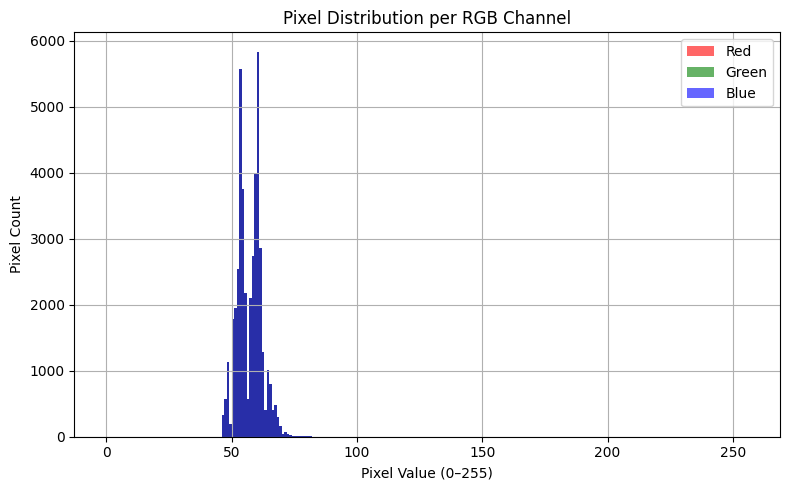

첫 번째 마스크의 픽셀 개수: 7420
첫 번째 마스크의 픽셀 개수: 7420.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 622 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 532 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 464 픽셀
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 443 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 359 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 306 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 300 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 296 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 263 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 262 픽셀
idx: 5, [O] Occupied Count: 3, Empty Count: 2, slot=A5, Score=0.930, width=145, height=76
idx: 5, [O] Occupied Count: 3, Empty Count: 2, 색상수=109, 채도편차=0.00, 비율=1.91


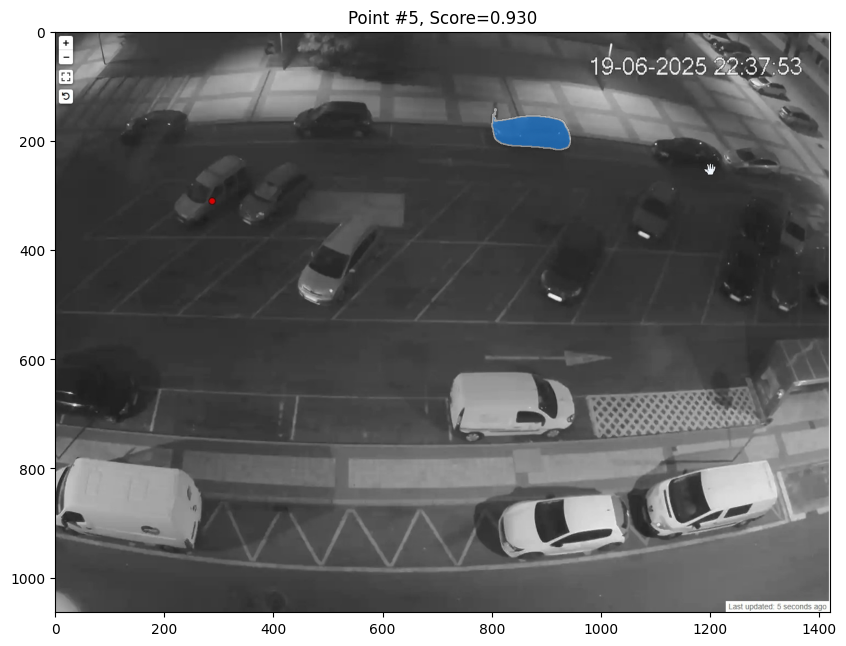

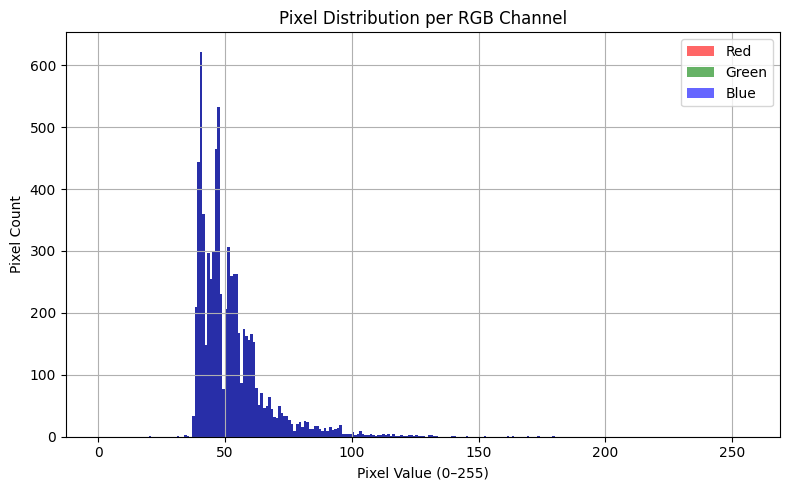

첫 번째 마스크의 픽셀 개수: 45204
첫 번째 마스크의 픽셀 개수: 45204.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 6137 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 4490 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 4319 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 3837 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 3156 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 3000 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 2782 픽셀
색상 (np.uint8(57), np.uint8(57), np.uint8(57)) → 2277 픽셀
색상 (np.uint8(55), np.uint8(55), np.uint8(55)) → 2235 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 1926 픽셀
idx: 6, [X] Occupied Count: 3, Empty Count: 3, slot=A6, Score=0.371, width=1108, height=117, 색상수=57, 채도편차=0.00, 비율=9.47


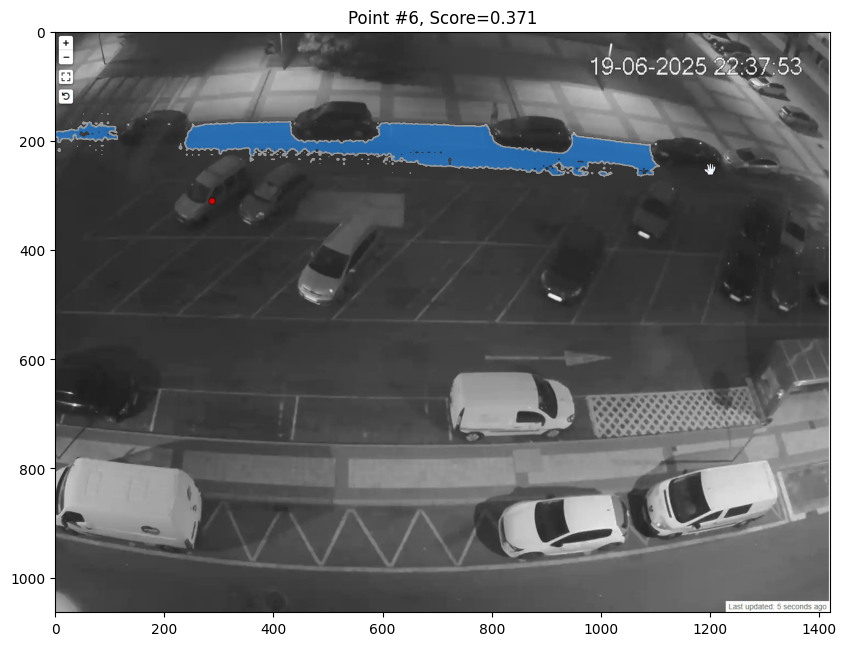

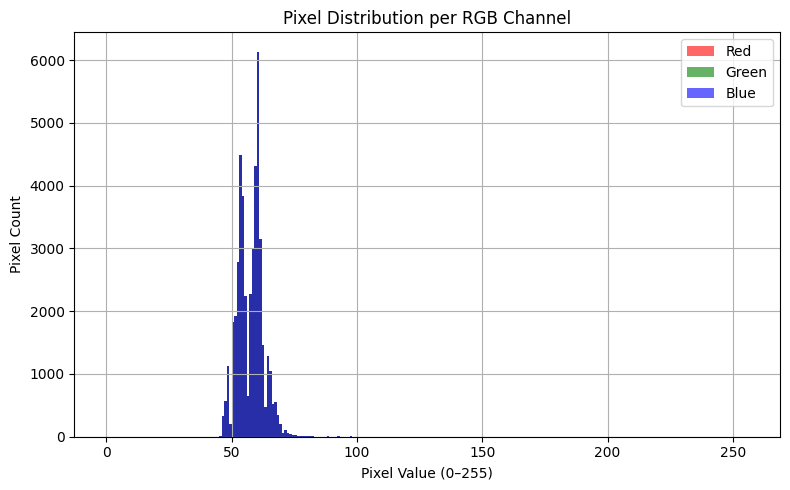

첫 번째 마스크의 픽셀 개수: 5870
첫 번째 마스크의 픽셀 개수: 5870.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 489 픽셀
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 433 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 344 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 322 픽셀
색상 (np.uint8(37), np.uint8(37), np.uint8(37)) → 247 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 244 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 242 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 224 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 220 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 198 픽셀
idx: 7, [O] Occupied Count: 4, Empty Count: 3, slot=A7, Score=0.918, width=131, height=62
idx: 7, [O] Occupied Count: 4, Empty Count: 3, 색상수=226, 채도편차=17.51, 비율=2.11


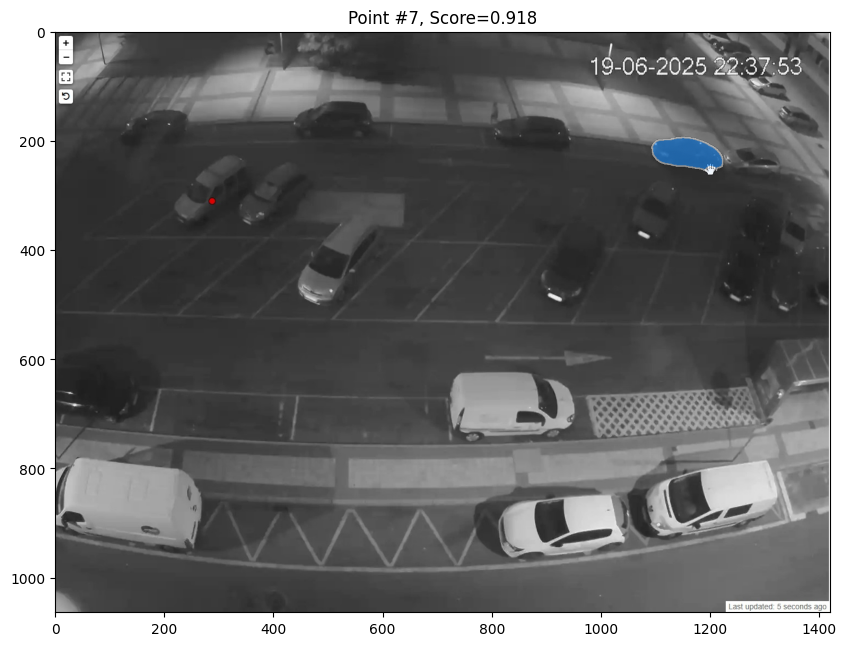

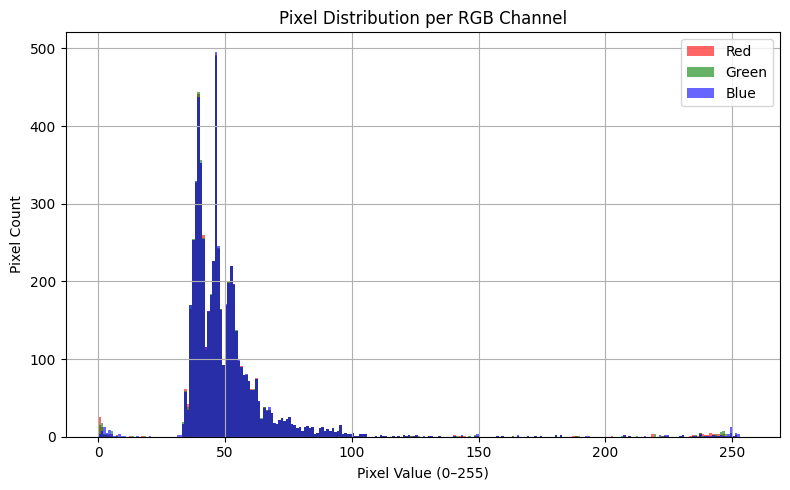

첫 번째 마스크의 픽셀 개수: 3988
첫 번째 마스크의 픽셀 개수: 3988.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(75), np.uint8(75), np.uint8(75)) → 153 픽셀
색상 (np.uint8(76), np.uint8(76), np.uint8(76)) → 124 픽셀
색상 (np.uint8(79), np.uint8(79), np.uint8(79)) → 119 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 115 픽셀
색상 (np.uint8(78), np.uint8(78), np.uint8(78)) → 113 픽셀
색상 (np.uint8(80), np.uint8(80), np.uint8(80)) → 102 픽셀
색상 (np.uint8(74), np.uint8(74), np.uint8(74)) → 96 픽셀
색상 (np.uint8(62), np.uint8(62), np.uint8(62)) → 83 픽셀
색상 (np.uint8(77), np.uint8(77), np.uint8(77)) → 82 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 80 픽셀
idx: 8, [X] Occupied Count: 4, Empty Count: 4, slot=A8, Score=0.863, width=103, height=49, 색상수=136, 채도편차=0.00, 비율=2.10


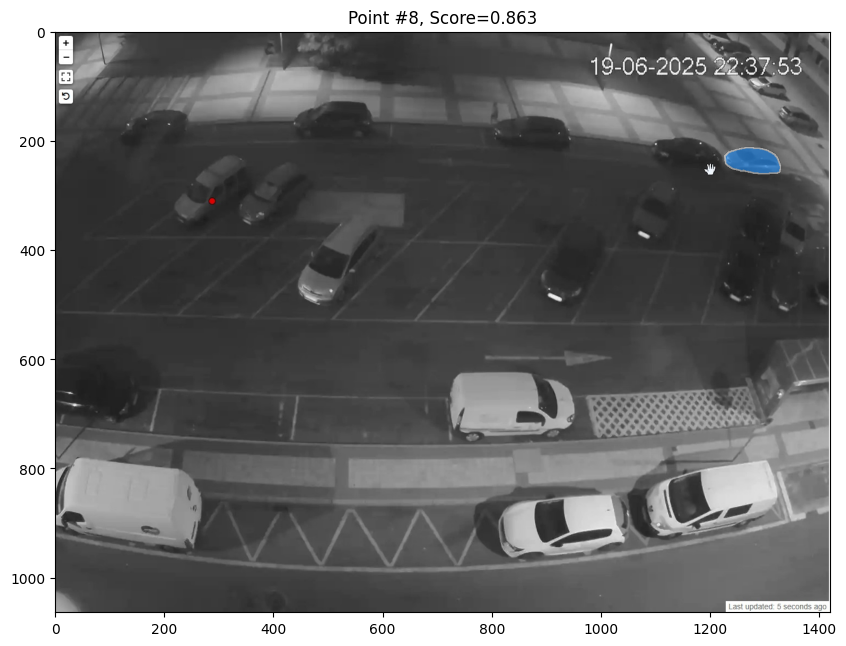

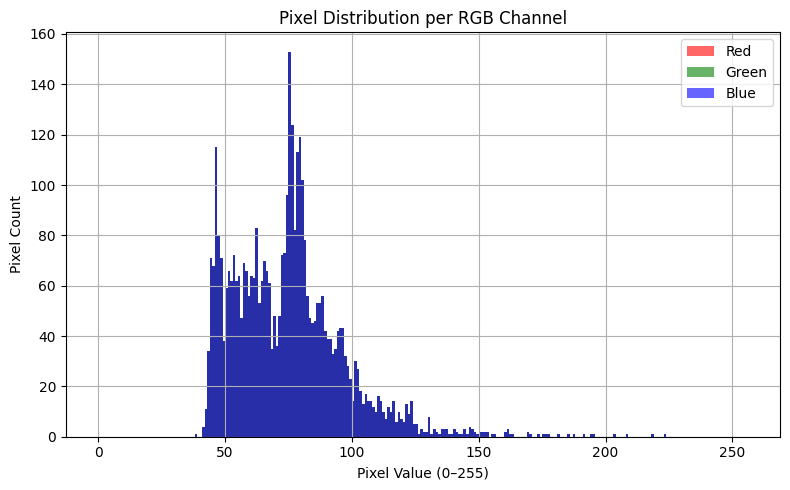

첫 번째 마스크의 픽셀 개수: 4895
첫 번째 마스크의 픽셀 개수: 4895.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 270 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 230 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 152 픽셀
색상 (np.uint8(64), np.uint8(64), np.uint8(64)) → 142 픽셀
색상 (np.uint8(62), np.uint8(62), np.uint8(62)) → 125 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 125 픽셀
색상 (np.uint8(67), np.uint8(67), np.uint8(67)) → 114 픽셀
색상 (np.uint8(66), np.uint8(66), np.uint8(66)) → 96 픽셀
색상 (np.uint8(68), np.uint8(68), np.uint8(68)) → 92 픽셀
색상 (np.uint8(65), np.uint8(65), np.uint8(65)) → 90 픽셀
idx: 9, [X] Occupied Count: 4, Empty Count: 5, slot=A9, Score=0.350, width=171, height=163, 색상수=102, 채도편차=0.00, 비율=1.05


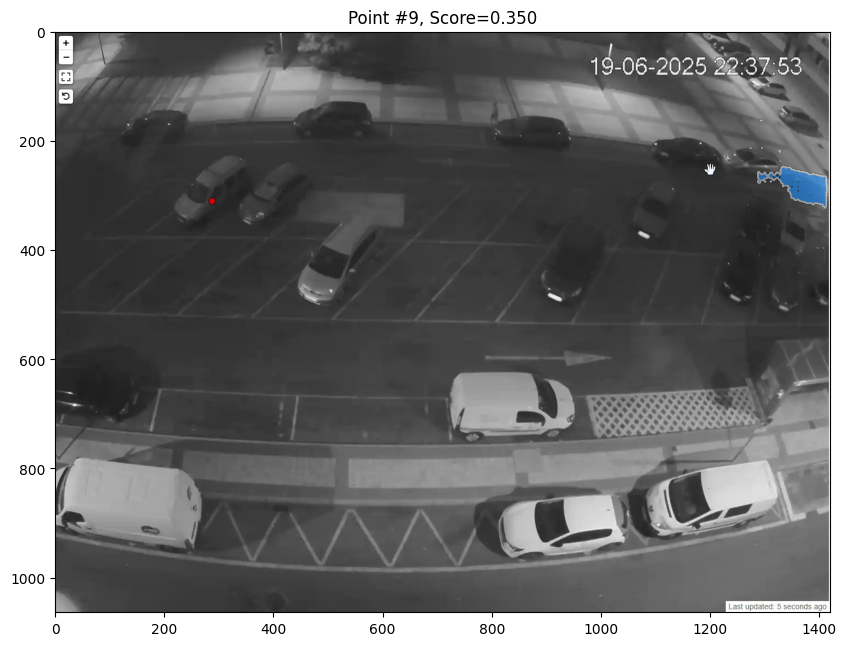

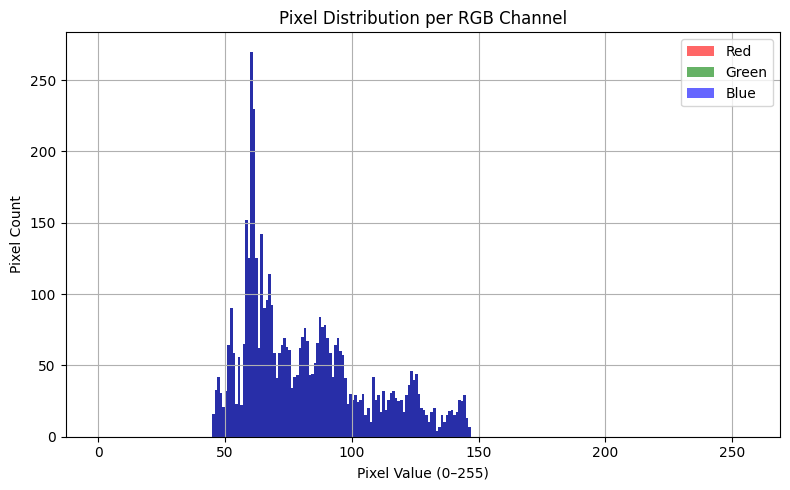

첫 번째 마스크의 픽셀 개수: 9473
첫 번째 마스크의 픽셀 개수: 9473.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 2448 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 1631 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 1599 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 1006 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 870 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 676 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 333 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 317 픽셀
색상 (np.uint8(49), np.uint8(49), np.uint8(49)) → 255 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 100 픽셀
idx: 10, [X] Occupied Count: 4, Empty Count: 6, slot=B1, Score=0.053, width=159, height=107, 색상수=20, 채도편차=0.00, 비율=1.49


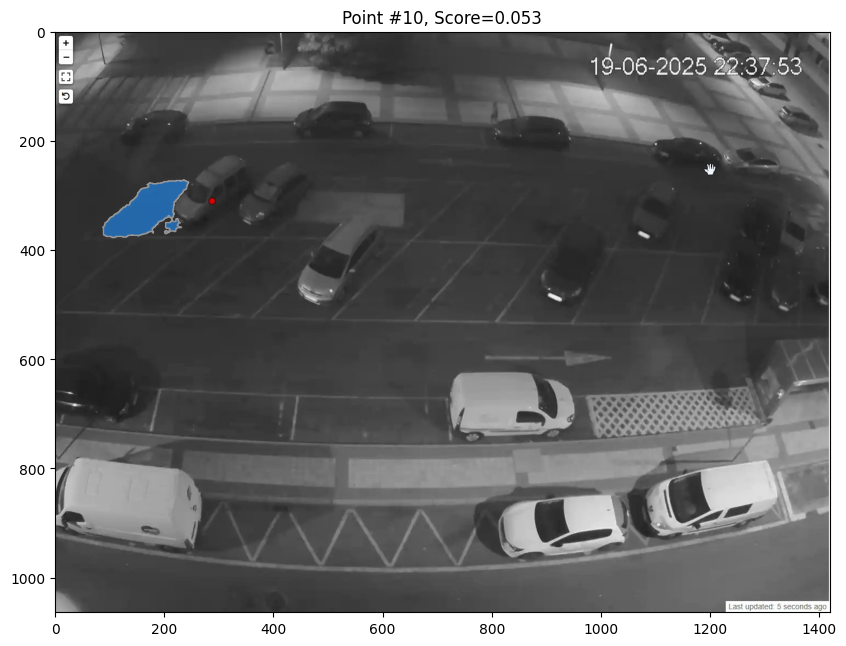

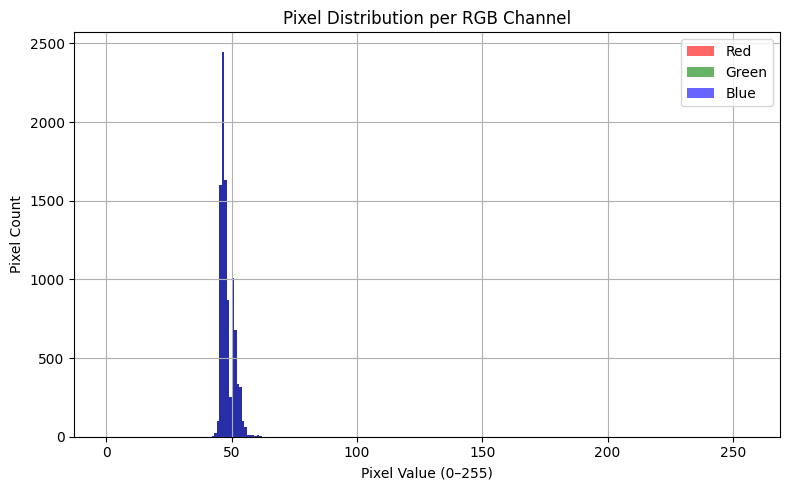

첫 번째 마스크의 픽셀 개수: 9554
첫 번째 마스크의 픽셀 개수: 9554.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 424 픽셀
색상 (np.uint8(81), np.uint8(81), np.uint8(81)) → 368 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 329 픽셀
색상 (np.uint8(80), np.uint8(80), np.uint8(80)) → 328 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 323 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 306 픽셀
색상 (np.uint8(82), np.uint8(82), np.uint8(82)) → 305 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 254 픽셀
색상 (np.uint8(79), np.uint8(79), np.uint8(79)) → 245 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 233 픽셀
idx: 11, [O] Occupied Count: 5, Empty Count: 6, slot=B2, Score=0.930, width=135, height=125
idx: 11, [O] Occupied Count: 5, Empty Count: 6, 색상수=473, 채도편차=29.29, 비율=1.08


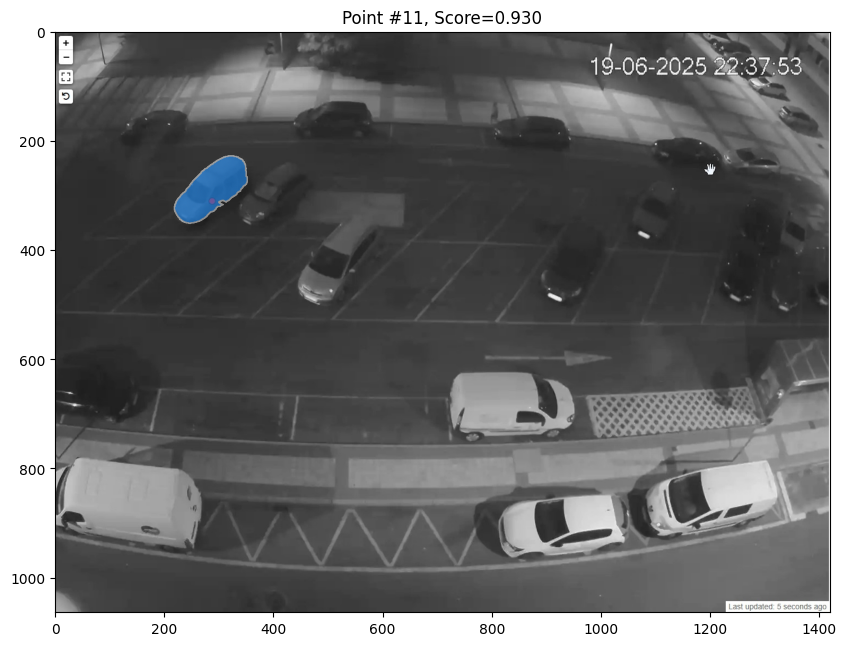

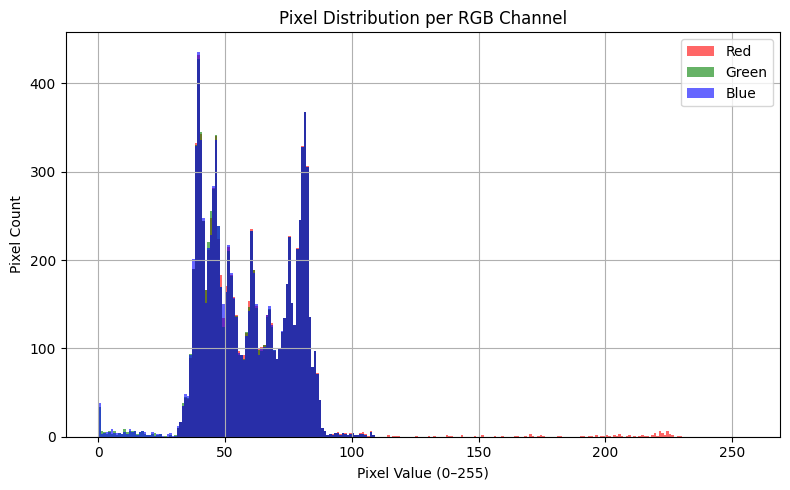

첫 번째 마스크의 픽셀 개수: 7084
첫 번째 마스크의 픽셀 개수: 7084.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 516 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 474 픽셀
색상 (np.uint8(62), np.uint8(62), np.uint8(62)) → 336 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 322 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 270 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 254 픽셀
색상 (np.uint8(64), np.uint8(64), np.uint8(64)) → 237 픽셀
색상 (np.uint8(66), np.uint8(66), np.uint8(66)) → 233 픽셀
색상 (np.uint8(67), np.uint8(67), np.uint8(67)) → 205 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 205 픽셀
idx: 12, [O] Occupied Count: 6, Empty Count: 6, slot=B3, Score=0.758, width=121, height=115
idx: 12, [O] Occupied Count: 6, Empty Count: 6, 색상수=105, 채도편차=0.00, 비율=1.05


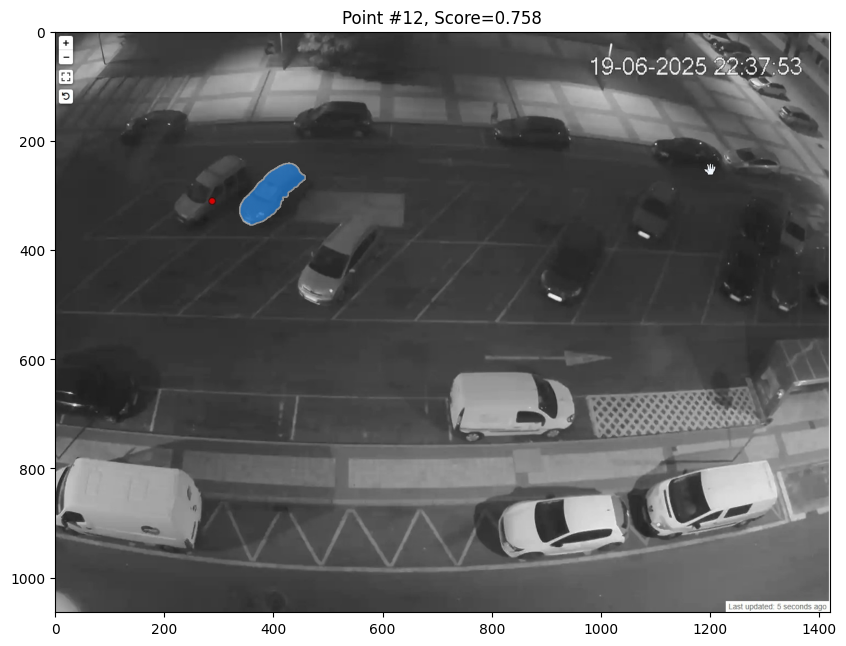

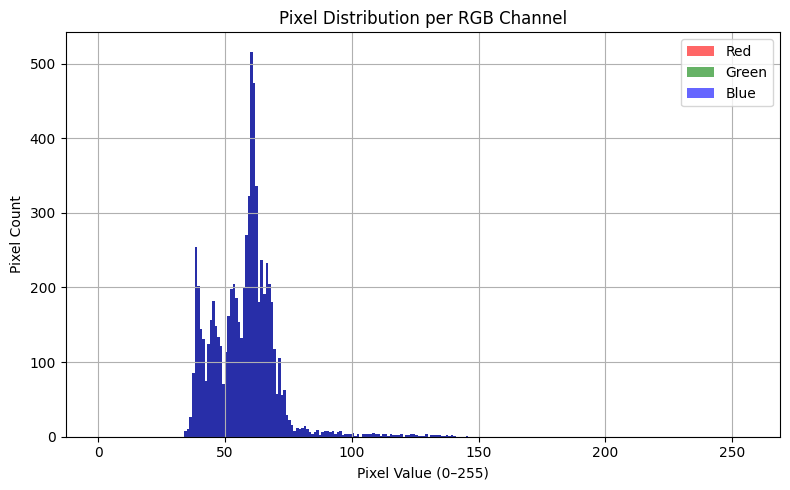

첫 번째 마스크의 픽셀 개수: 12534
첫 번째 마스크의 픽셀 개수: 12534.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 516 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 474 픽셀
색상 (np.uint8(62), np.uint8(62), np.uint8(62)) → 336 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 322 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 270 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 254 픽셀
색상 (np.uint8(64), np.uint8(64), np.uint8(64)) → 237 픽셀
색상 (np.uint8(66), np.uint8(66), np.uint8(66)) → 233 픽셀
색상 (np.uint8(67), np.uint8(67), np.uint8(67)) → 205 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 205 픽셀
idx: 13, [O] Occupied Count: 7, Empty Count: 6


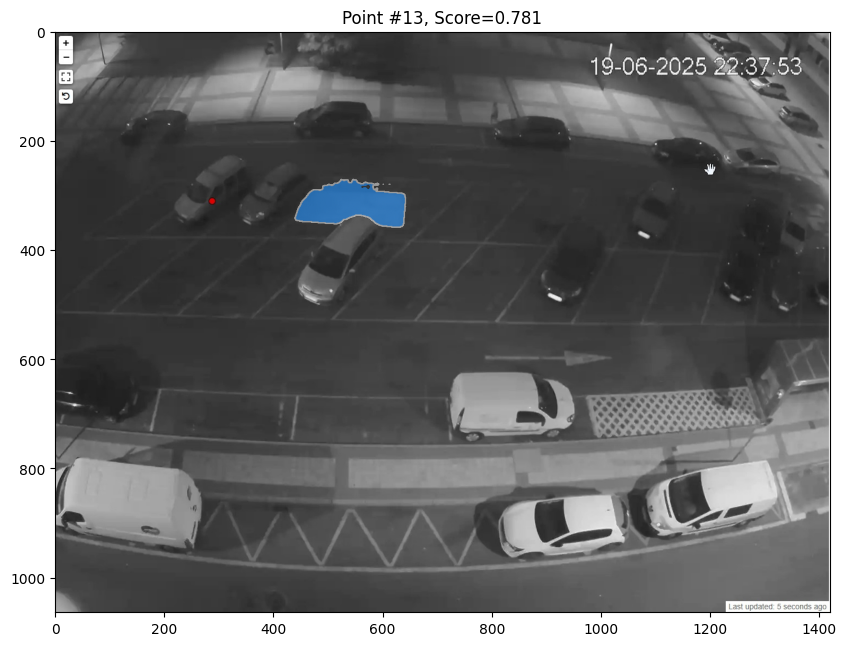

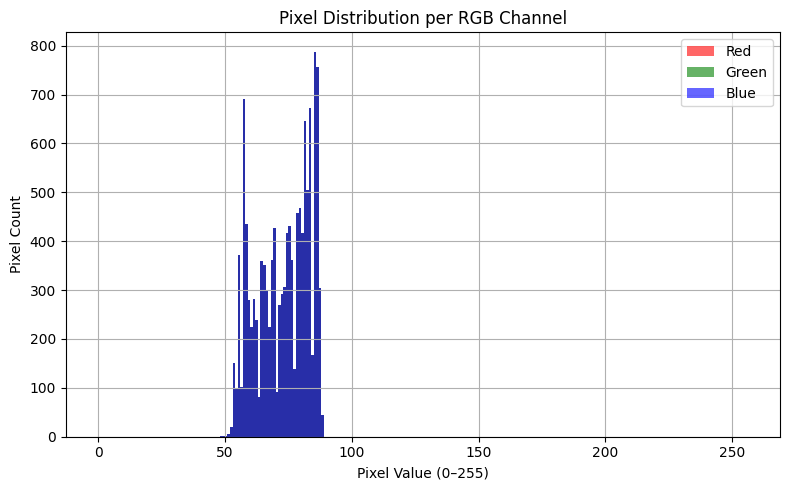

첫 번째 마스크의 픽셀 개수: 10837
첫 번째 마스크의 픽셀 개수: 10837.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(85), np.uint8(85), np.uint8(85)) → 792 픽셀
색상 (np.uint8(86), np.uint8(86), np.uint8(86)) → 761 픽셀
색상 (np.uint8(83), np.uint8(83), np.uint8(83)) → 675 픽셀
색상 (np.uint8(81), np.uint8(81), np.uint8(81)) → 650 픽셀
색상 (np.uint8(82), np.uint8(82), np.uint8(82)) → 505 픽셀
색상 (np.uint8(79), np.uint8(79), np.uint8(79)) → 471 픽셀
색상 (np.uint8(78), np.uint8(78), np.uint8(78)) → 460 픽셀
색상 (np.uint8(75), np.uint8(75), np.uint8(75)) → 432 픽셀
색상 (np.uint8(69), np.uint8(69), np.uint8(69)) → 429 픽셀
색상 (np.uint8(80), np.uint8(80), np.uint8(80)) → 418 픽셀
idx: 14, [X] Occupied Count: 7, Empty Count: 7, slot=B5, Score=0.922, width=204, height=68, 색상수=38, 채도편차=0.00, 비율=3.00


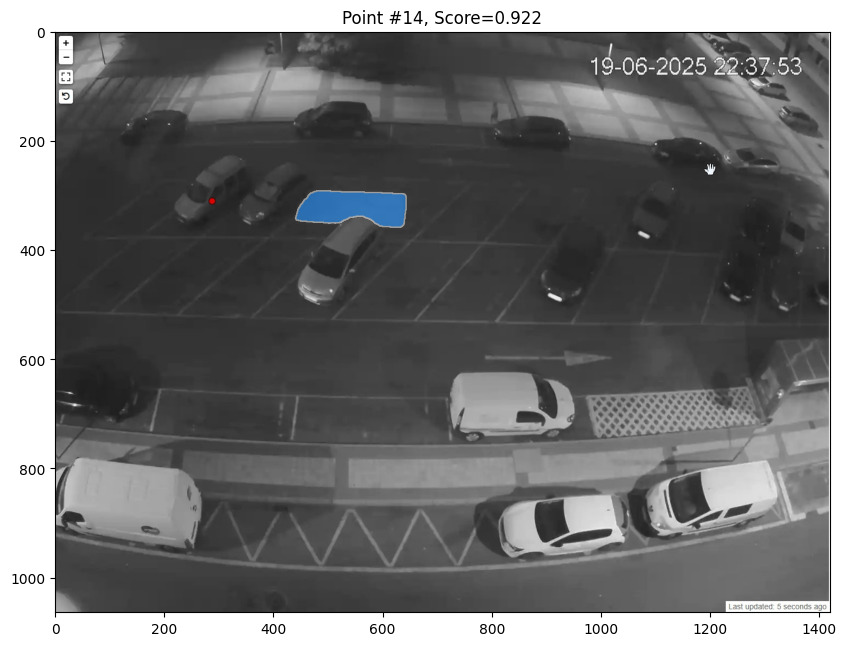

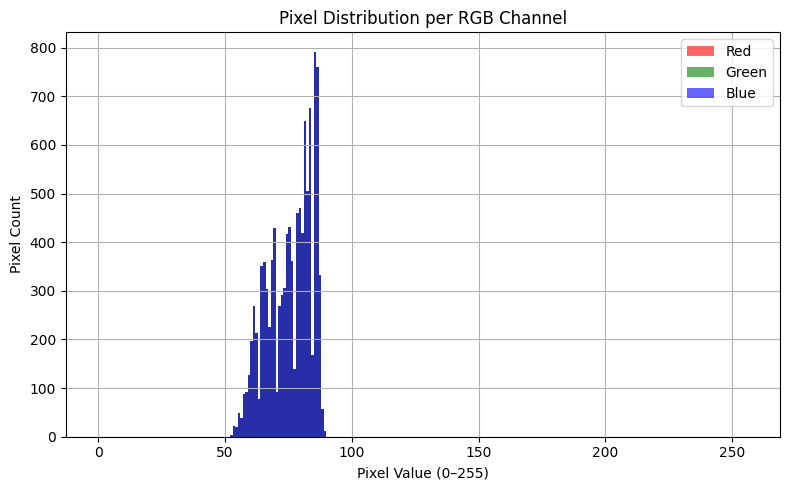

첫 번째 마스크의 픽셀 개수: 524200
첫 번째 마스크의 픽셀 개수: 524200.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 45390 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 36609 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 31336 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 28584 픽셀
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 28273 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 25939 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 23162 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 22263 픽셀
색상 (np.uint8(55), np.uint8(55), np.uint8(55)) → 22103 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 21580 픽셀
idx: 15, [X] Occupied Count: 7, Empty Count: 8, slot=B6, Score=0.235, width=1416, height=894, 색상수=120, 채도편차=0.06, 비율=1.58


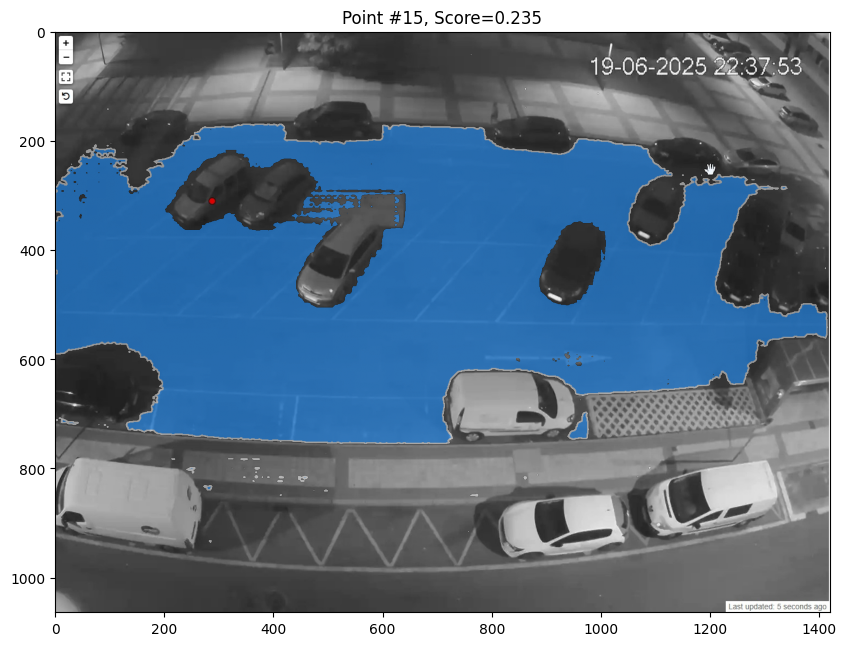

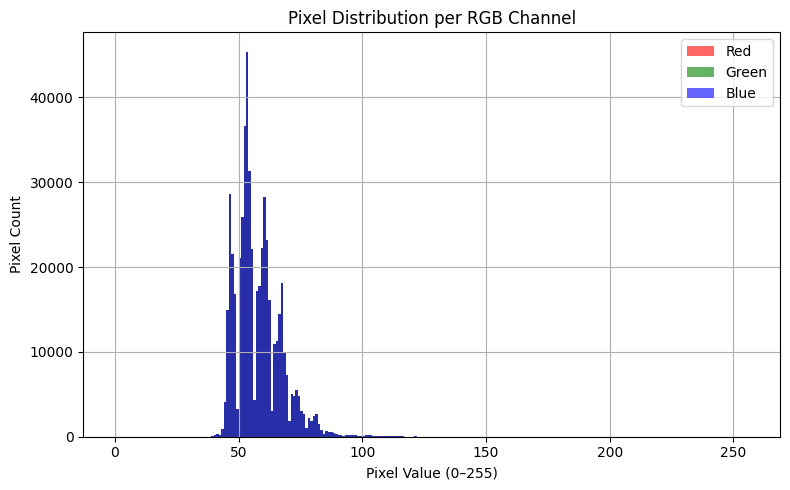

첫 번째 마스크의 픽셀 개수: 125319
첫 번째 마스크의 픽셀 개수: 125319.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 15233 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 12319 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 11674 픽셀
색상 (np.uint8(55), np.uint8(55), np.uint8(55)) → 10300 픽셀
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 9177 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 7821 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 7178 픽셀
색상 (np.uint8(57), np.uint8(57), np.uint8(57)) → 7132 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 7034 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 6246 픽셀
idx: 16, [X] Occupied Count: 7, Empty Count: 9, slot=B7, Score=0.097, width=1180, height=360, 색상수=70, 채도편차=0.00, 비율=3.28


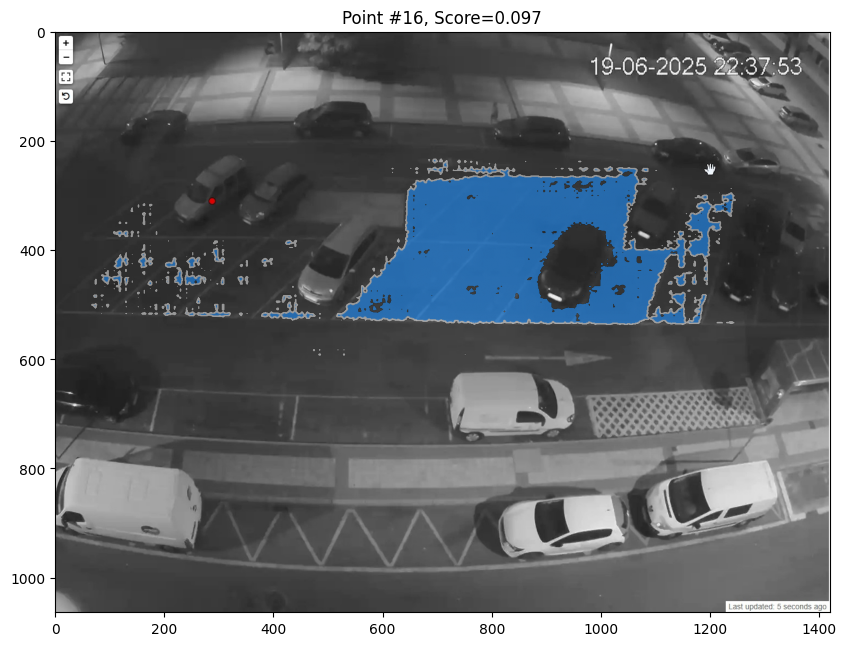

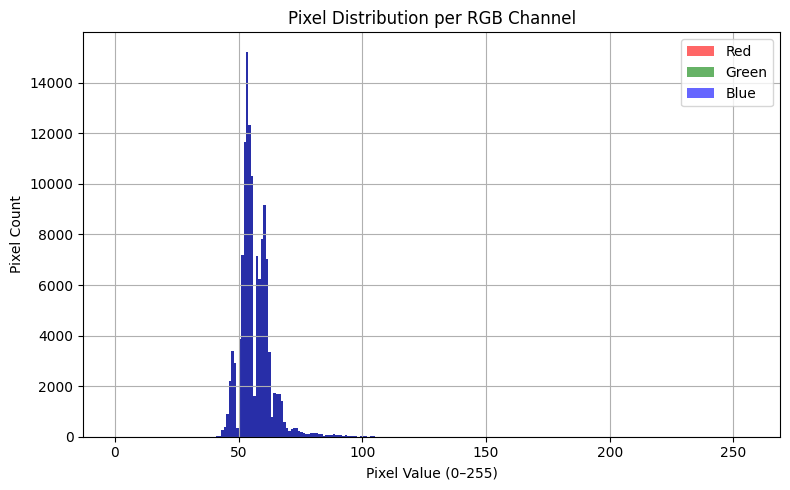

첫 번째 마스크의 픽셀 개수: 12523
첫 번째 마스크의 픽셀 개수: 12523.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 1534 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 1506 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 1478 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 1149 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 892 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 742 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 690 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 670 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 579 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 424 픽셀
idx: 17, [O] Occupied Count: 8, Empty Count: 9, slot=B8, Score=0.762, width=120, height=153
idx: 17, [O] Occupied Count: 8, Empty Count: 9, 색상수=168, 채도편차=0.00, 비율=0.78


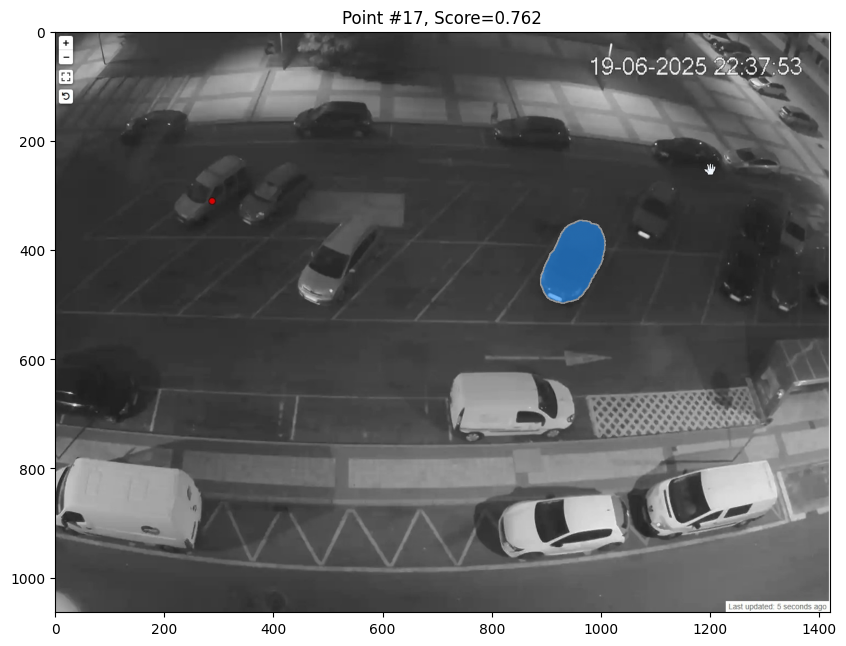

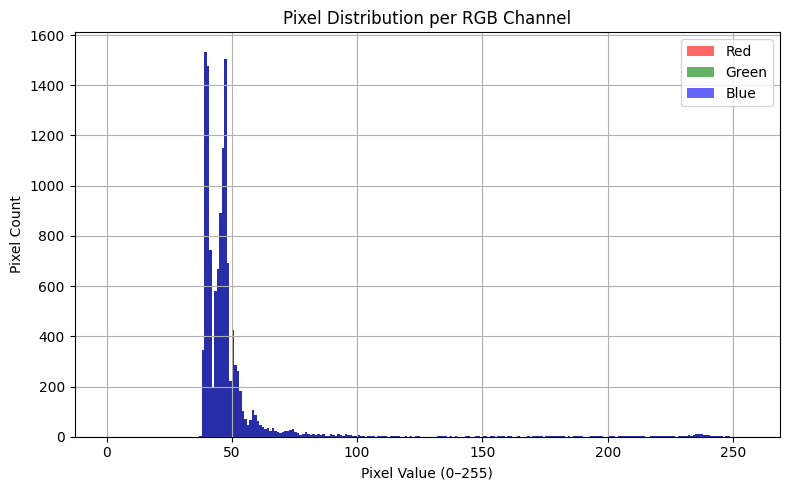

첫 번째 마스크의 픽셀 개수: 11370
첫 번째 마스크의 픽셀 개수: 11370.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 1534 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 1506 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 1478 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 1149 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 892 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 742 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 690 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 670 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 579 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 424 픽셀
idx: 18, [O] Occupied Count: 9, Empty Count: 9


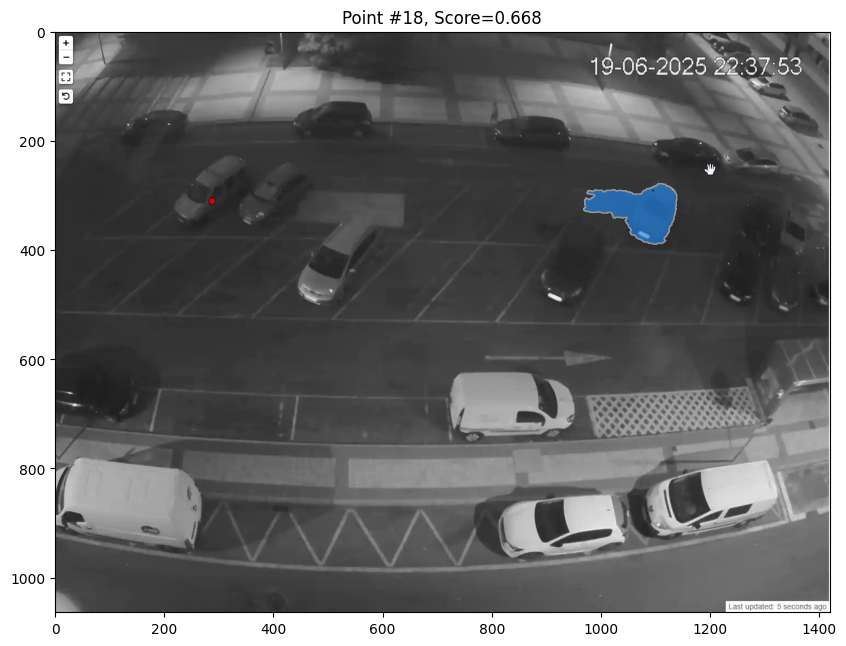

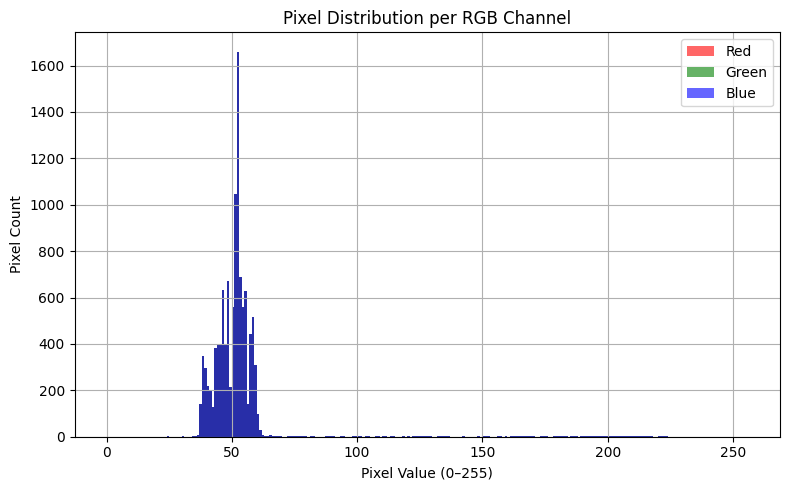

첫 번째 마스크의 픽셀 개수: 586556
첫 번째 마스크의 픽셀 개수: 586556.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 47221 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 38254 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 32985 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 30943 픽셀
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 29211 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 27910 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 23966 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 23624 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 23428 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 23222 픽셀
idx: 19, [X] Occupied Count: 9, Empty Count: 10, slot=B10, Score=0.182, width=1416, height=971, 색상수=176, 채도편차=0.08, 비율=1.46


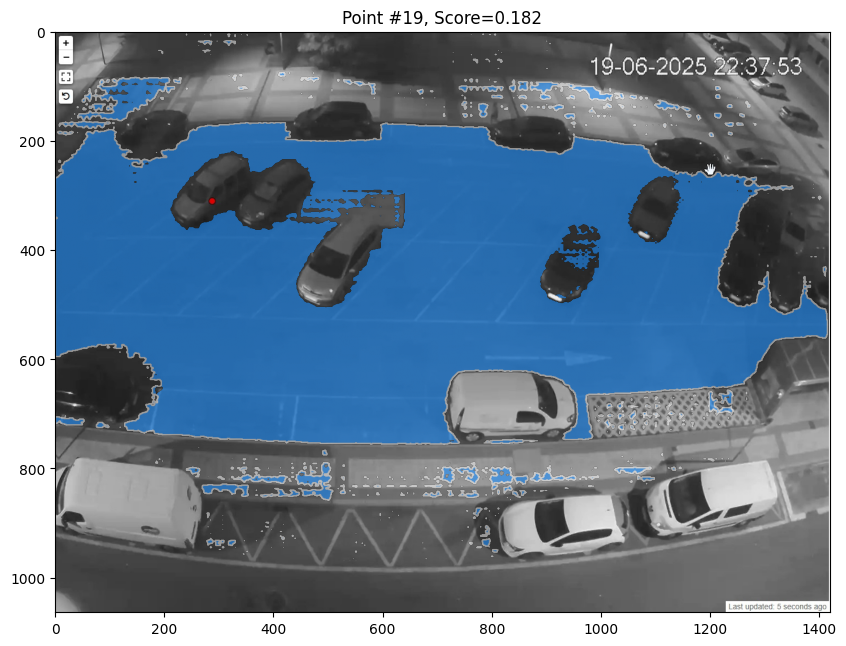

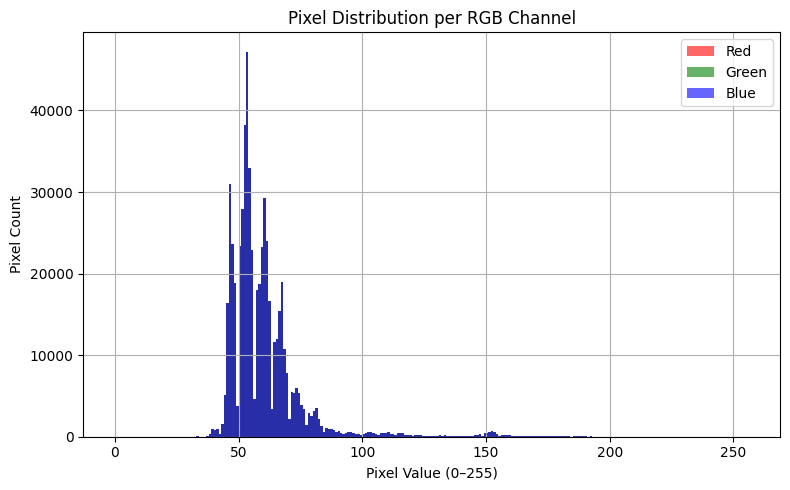

첫 번째 마스크의 픽셀 개수: 5676
첫 번째 마스크의 픽셀 개수: 5676.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(36), np.uint8(36), np.uint8(36)) → 930 픽셀
색상 (np.uint8(37), np.uint8(37), np.uint8(37)) → 651 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 579 픽셀
색상 (np.uint8(34), np.uint8(34), np.uint8(34)) → 505 픽셀
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 393 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 298 픽셀
색상 (np.uint8(33), np.uint8(33), np.uint8(33)) → 279 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 257 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 231 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 229 픽셀
idx: 20, [O] Occupied Count: 10, Empty Count: 10, slot=B11, Score=0.766, width=80, height=97
idx: 20, [O] Occupied Count: 10, Empty Count: 10, 색상수=45, 채도편차=0.00, 비율=0.82


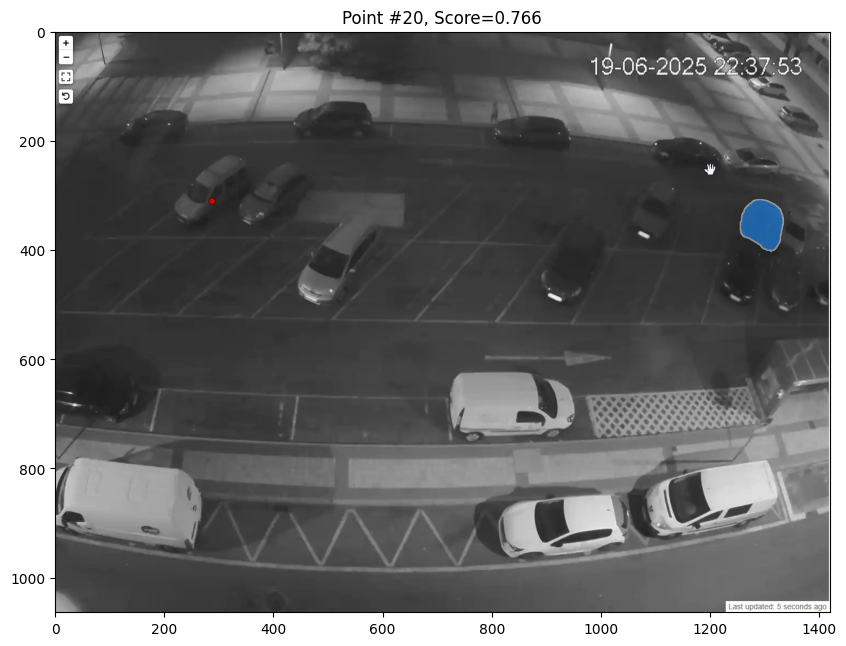

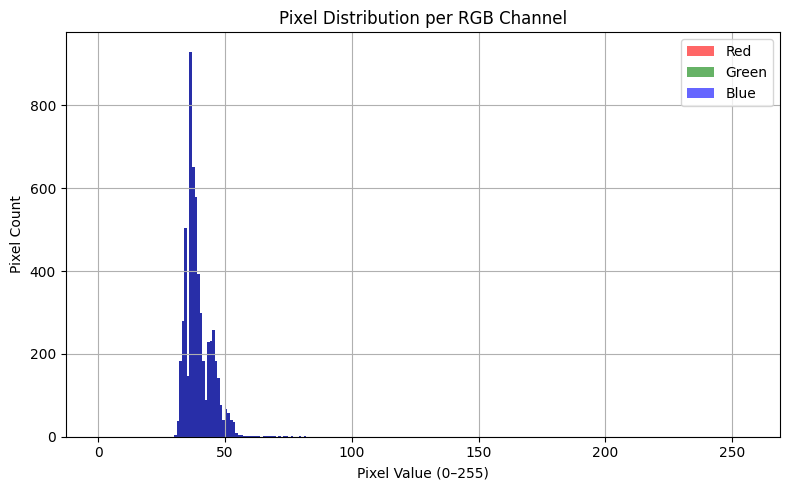

첫 번째 마스크의 픽셀 개수: 2079
첫 번째 마스크의 픽셀 개수: 2079.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(64), np.uint8(64), np.uint8(64)) → 171 픽셀
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 158 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 130 픽셀
색상 (np.uint8(65), np.uint8(65), np.uint8(65)) → 109 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 105 픽셀
색상 (np.uint8(66), np.uint8(66), np.uint8(66)) → 86 픽셀
색상 (np.uint8(37), np.uint8(37), np.uint8(37)) → 79 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 74 픽셀
색상 (np.uint8(62), np.uint8(62), np.uint8(62)) → 73 픽셀
색상 (np.uint8(63), np.uint8(63), np.uint8(63)) → 56 픽셀
idx: 21, [X] Occupied Count: 10, Empty Count: 11, slot=B12, Score=0.738, width=47, height=64, 색상수=63, 채도편차=0.00, 비율=0.73


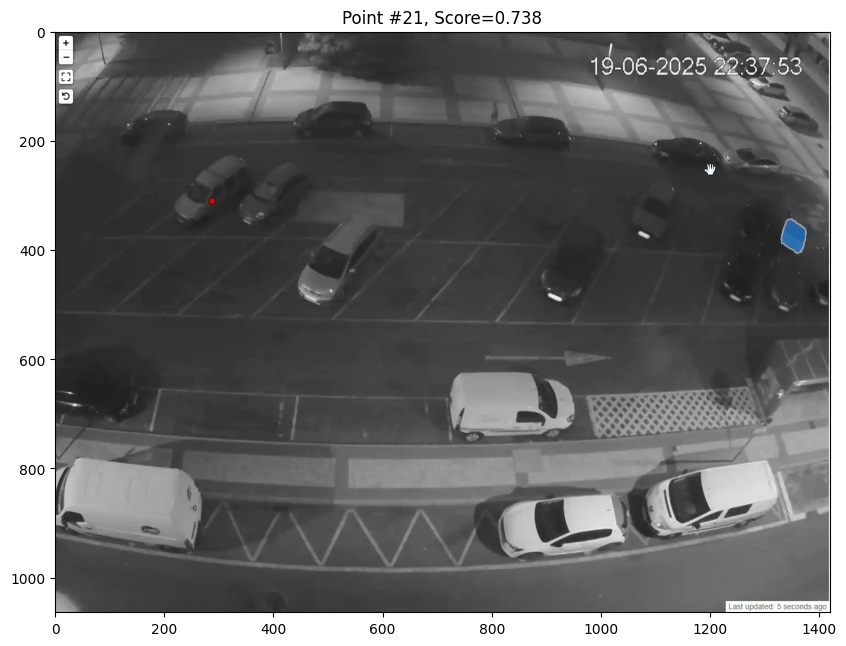

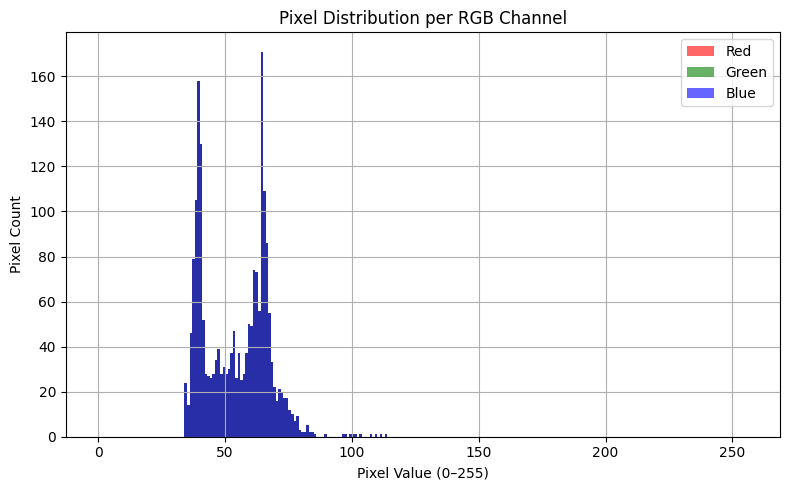

첫 번째 마스크의 픽셀 개수: 12612
첫 번째 마스크의 픽셀 개수: 12612.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 3426 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 2978 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 2414 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 1333 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 942 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 295 픽셀
색상 (np.uint8(49), np.uint8(49), np.uint8(49)) → 261 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 261 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 169 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 152 픽셀
idx: 22, [O] Occupied Count: 11, Empty Count: 11, slot=C1, Score=0.719, width=208, height=128
idx: 22, [O] Occupied Count: 11, Empty Count: 11, 색상수=23, 채도편차=0.00, 비율=1.62


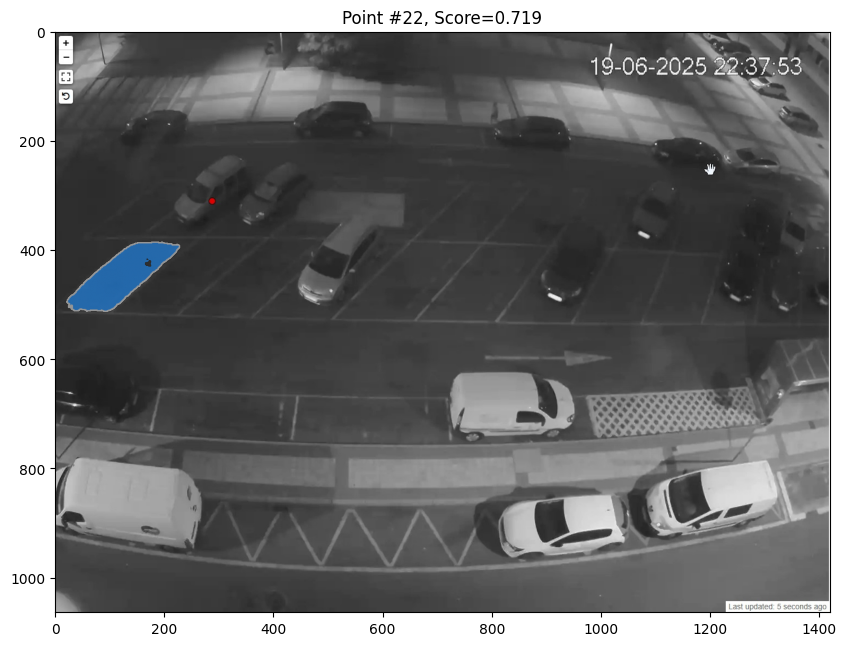

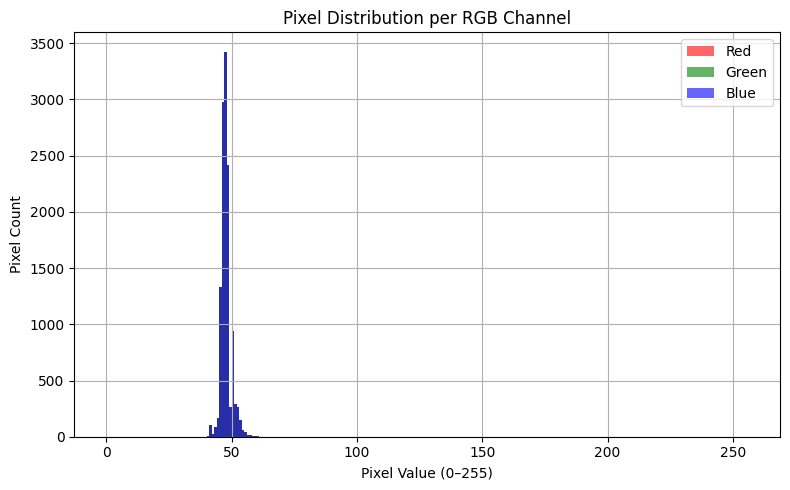

첫 번째 마스크의 픽셀 개수: 14739
첫 번째 마스크의 픽셀 개수: 14739.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 3335 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 3028 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 2211 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 1886 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 1220 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 1002 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 736 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 407 픽셀
색상 (np.uint8(49), np.uint8(49), np.uint8(49)) → 311 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 213 픽셀
idx: 23, [X] Occupied Count: 11, Empty Count: 12, slot=C2, Score=0.512, width=244, height=132, 색상수=24, 채도편차=0.00, 비율=1.85


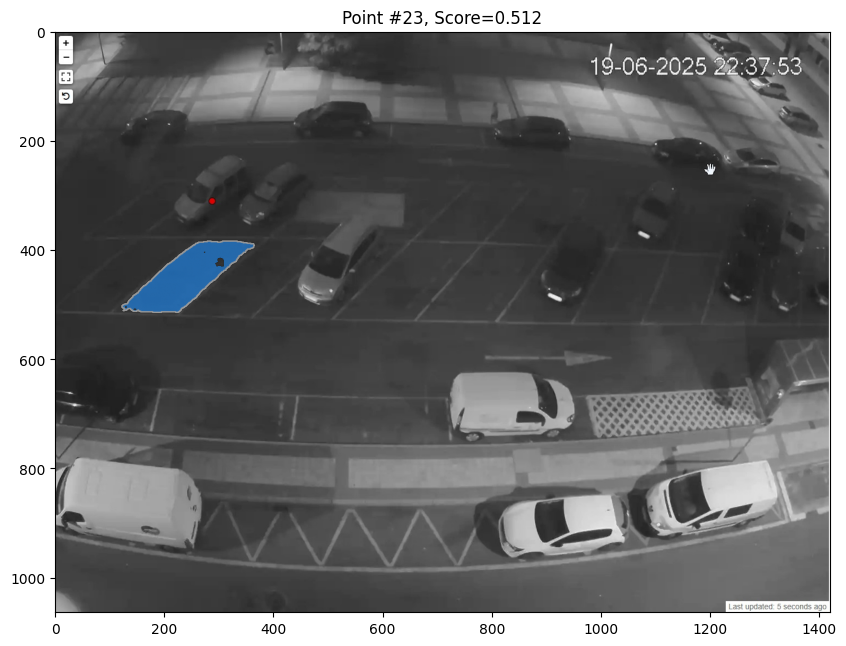

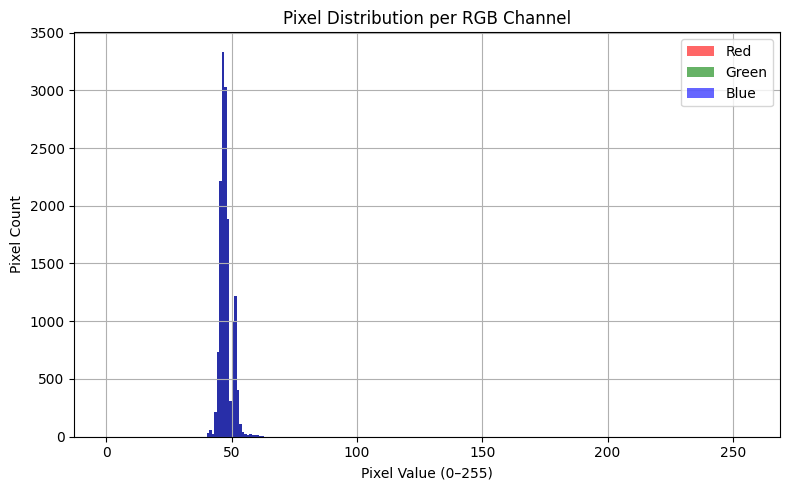

첫 번째 마스크의 픽셀 개수: 32358
첫 번째 마스크의 픽셀 개수: 32358.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 4660 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 4440 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 3576 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 3255 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 2962 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 2666 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 2647 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 2321 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 1690 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 859 픽셀
idx: 24, [X] Occupied Count: 11, Empty Count: 13, slot=C3, Score=0.377, width=411, height=142, 색상수=36, 채도편차=0.00, 비율=2.89


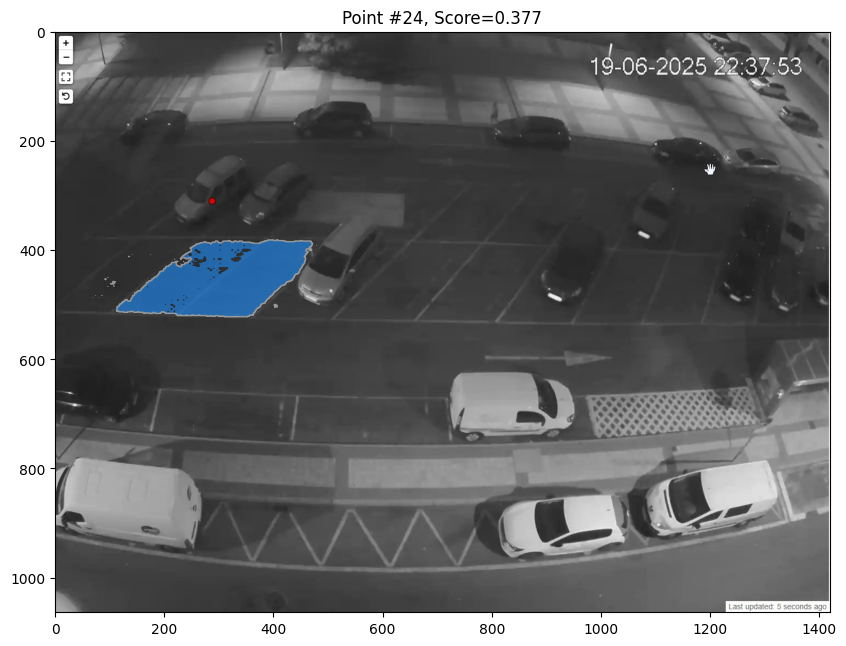

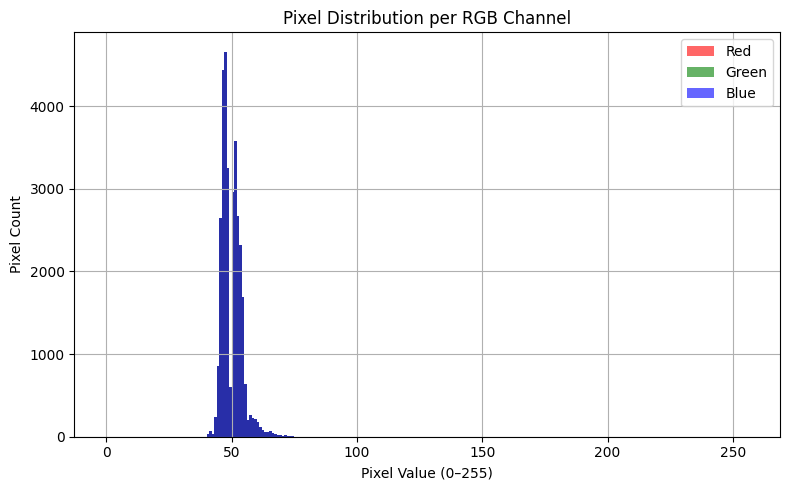

첫 번째 마스크의 픽셀 개수: 11473
첫 번째 마스크의 픽셀 개수: 11473.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 816 픽셀
색상 (np.uint8(90), np.uint8(90), np.uint8(90)) → 619 픽셀
색상 (np.uint8(91), np.uint8(91), np.uint8(91)) → 569 픽셀
색상 (np.uint8(89), np.uint8(89), np.uint8(89)) → 539 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 493 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 314 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 313 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 301 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 274 픽셀
색상 (np.uint8(88), np.uint8(88), np.uint8(88)) → 243 픽셀
idx: 25, [O] Occupied Count: 12, Empty Count: 13, slot=C4, Score=0.680, width=145, height=154
idx: 25, [O] Occupied Count: 12, Empty Count: 13, 색상수=180, 채도편차=0.00, 비율=0.94


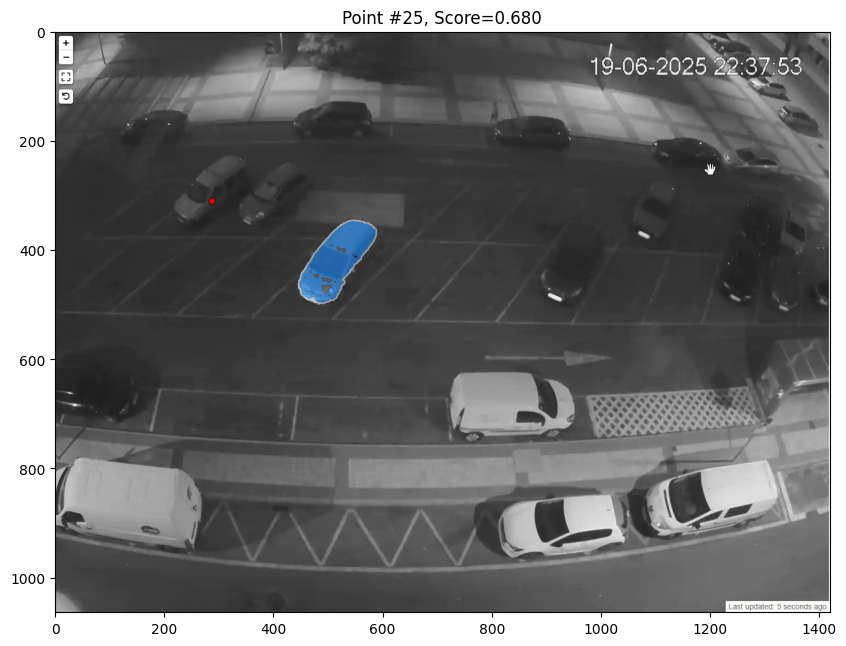

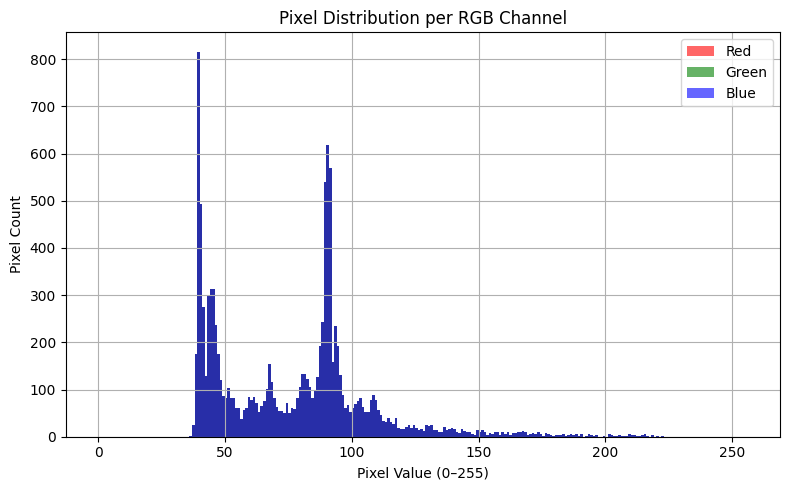

첫 번째 마스크의 픽셀 개수: 15629
첫 번째 마스크의 픽셀 개수: 15629.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 2922 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 2652 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 2598 픽셀
색상 (np.uint8(57), np.uint8(57), np.uint8(57)) → 1819 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 1284 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 981 픽셀
색상 (np.uint8(55), np.uint8(55), np.uint8(55)) → 774 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 748 픽셀
색상 (np.uint8(62), np.uint8(62), np.uint8(62)) → 619 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 364 픽셀
idx: 26, [X] Occupied Count: 12, Empty Count: 14, slot=C5, Score=0.566, width=258, height=139, 색상수=21, 채도편차=0.00, 비율=1.86


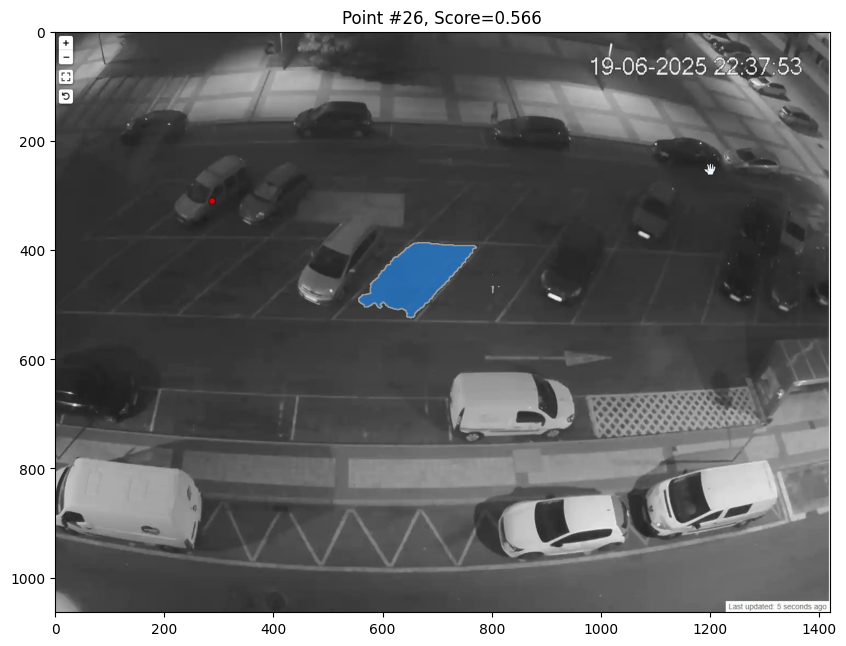

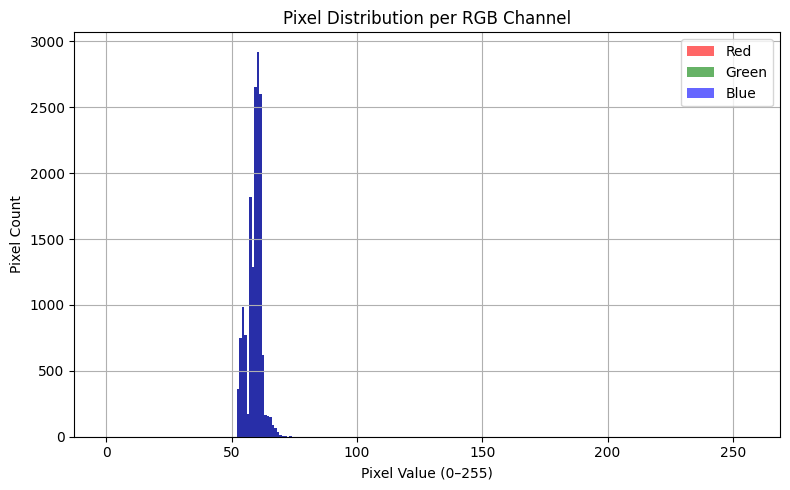

첫 번째 마스크의 픽셀 개수: 17088
첫 번째 마스크의 픽셀 개수: 17088.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 2851 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 1976 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 1859 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 1571 픽셀
색상 (np.uint8(62), np.uint8(62), np.uint8(62)) → 1500 픽셀
색상 (np.uint8(57), np.uint8(57), np.uint8(57)) → 1362 픽셀
색상 (np.uint8(64), np.uint8(64), np.uint8(64)) → 919 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 896 픽셀
색상 (np.uint8(65), np.uint8(65), np.uint8(65)) → 839 픽셀
색상 (np.uint8(66), np.uint8(66), np.uint8(66)) → 767 픽셀
idx: 27, [O] Occupied Count: 13, Empty Count: 14, slot=C6, Score=0.746, width=205, height=138
idx: 27, [O] Occupied Count: 13, Empty Count: 14, 색상수=39, 채도편차=0.00, 비율=1.49


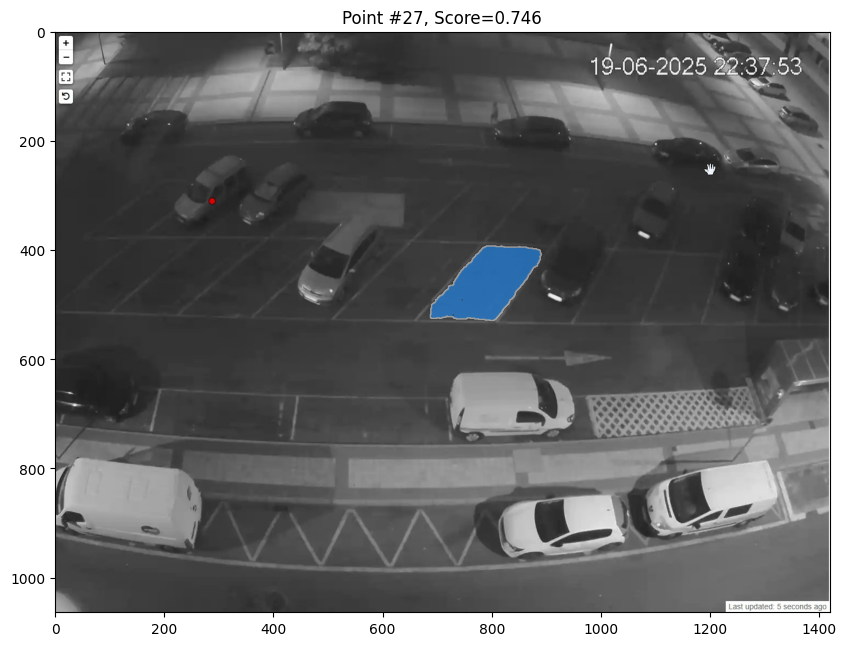

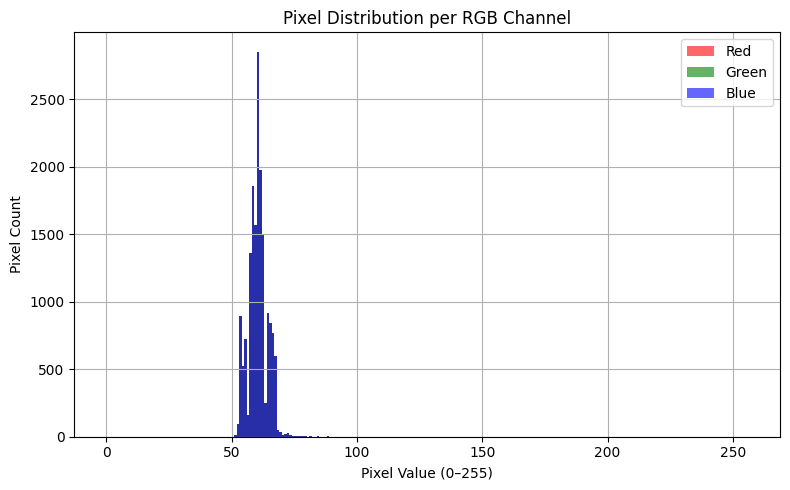

첫 번째 마스크의 픽셀 개수: 11356
첫 번째 마스크의 픽셀 개수: 11356.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 1534 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 1478 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 1300 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 1074 픽셀
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 848 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 745 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 671 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 578 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 465 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 345 픽셀
idx: 28, [O] Occupied Count: 14, Empty Count: 14, slot=C7, Score=0.879, width=117, height=140
idx: 28, [O] Occupied Count: 14, Empty Count: 14, 색상수=168, 채도편차=0.00, 비율=0.84


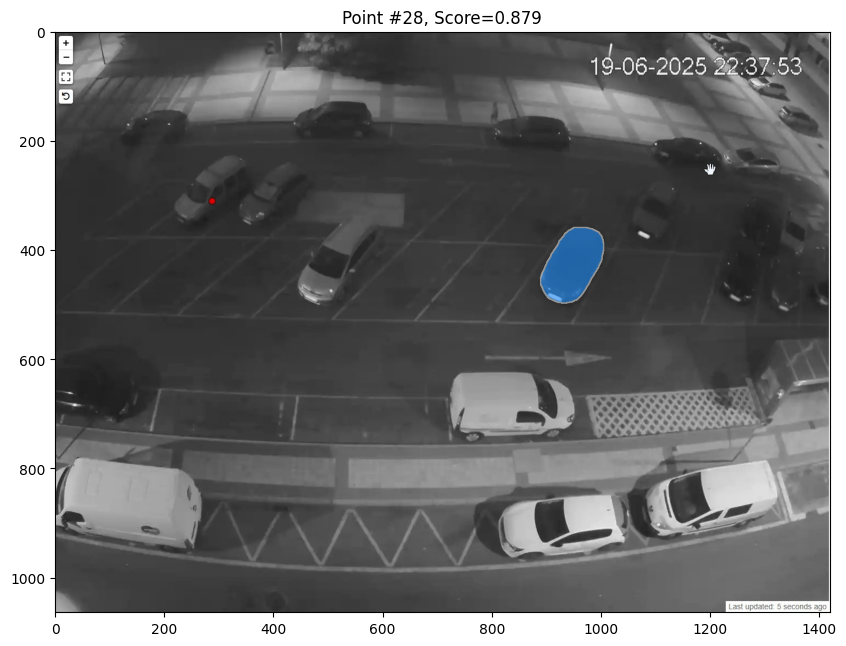

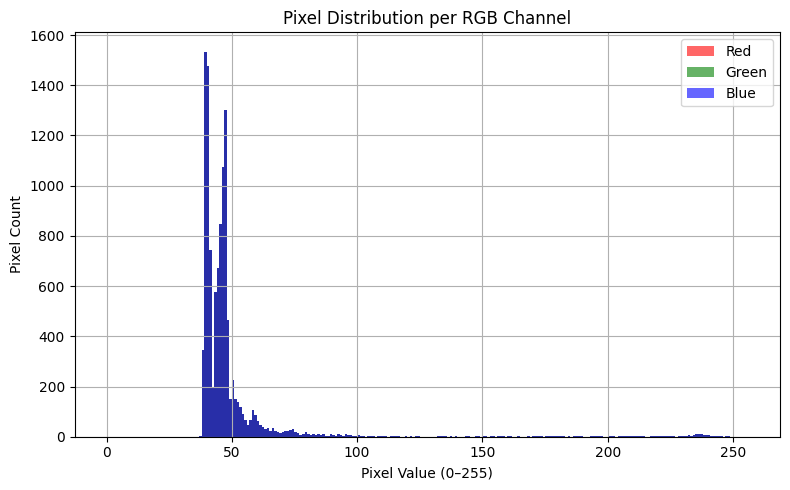

첫 번째 마스크의 픽셀 개수: 15837
첫 번째 마스크의 픽셀 개수: 15837.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 3128 픽셀
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 2893 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 1761 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 1643 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 1146 픽셀
색상 (np.uint8(55), np.uint8(55), np.uint8(55)) → 1087 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 1008 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 621 픽셀
색상 (np.uint8(57), np.uint8(57), np.uint8(57)) → 572 픽셀
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 567 픽셀
idx: 29, [O] Occupied Count: 15, Empty Count: 14, slot=C8, Score=0.738, width=215, height=135
idx: 29, [O] Occupied Count: 15, Empty Count: 14, 색상수=36, 채도편차=0.00, 비율=1.59


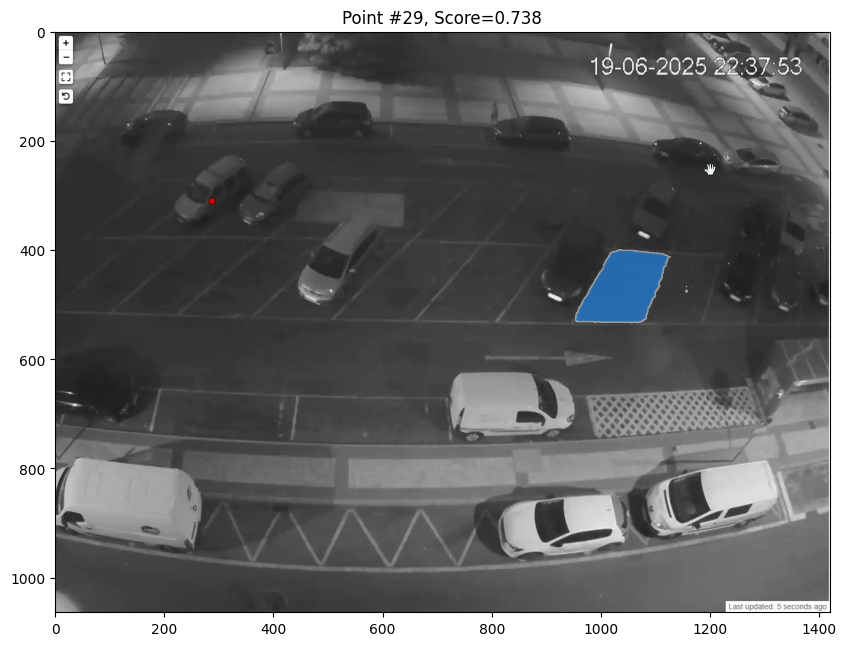

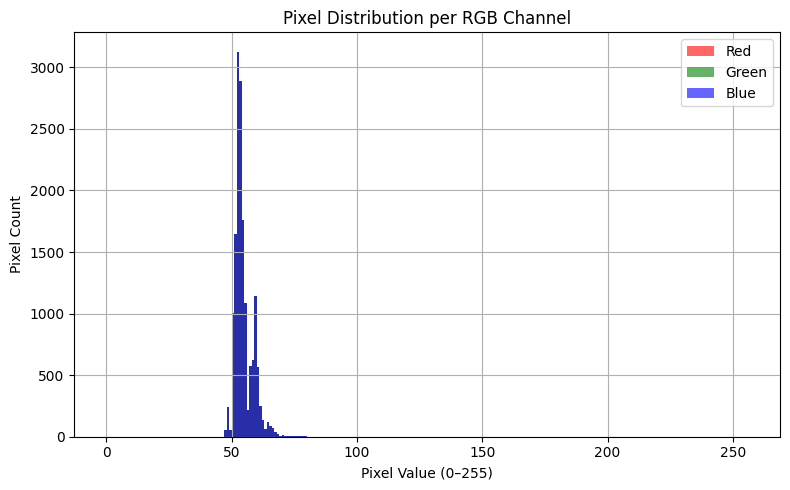

첫 번째 마스크의 픽셀 개수: 12816
첫 번째 마스크의 픽셀 개수: 12816.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(53), np.uint8(53), np.uint8(53)) → 2818 픽셀
색상 (np.uint8(52), np.uint8(52), np.uint8(52)) → 1539 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 1484 픽셀
색상 (np.uint8(55), np.uint8(55), np.uint8(55)) → 1282 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 1008 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 582 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 489 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 449 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 413 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 376 픽셀
idx: 30, [O] Occupied Count: 16, Empty Count: 14, slot=C9, Score=0.801, width=223, height=128
idx: 30, [O] Occupied Count: 16, Empty Count: 14, 색상수=38, 채도편차=0.00, 비율=1.74


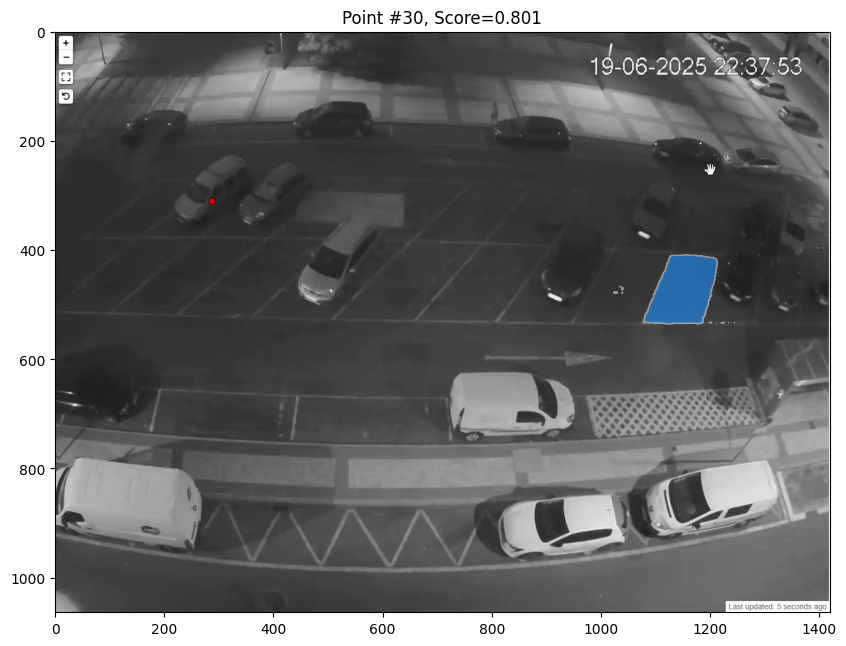

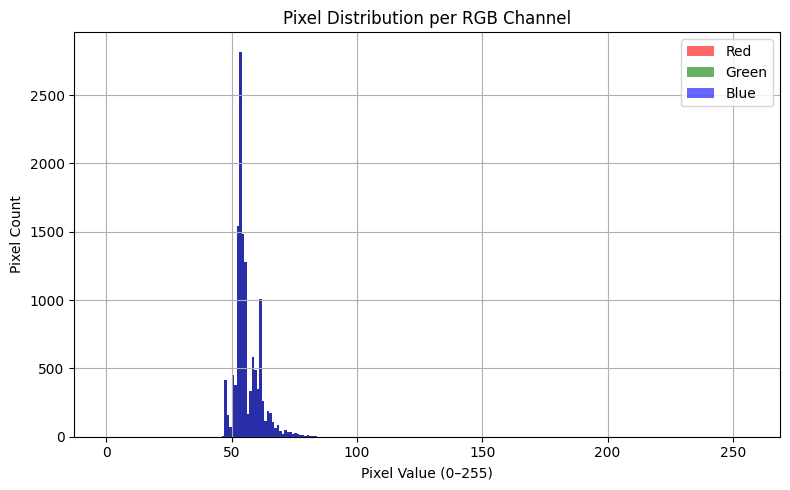

첫 번째 마스크의 픽셀 개수: 6605
첫 번째 마스크의 픽셀 개수: 6605.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 1030 픽셀
색상 (np.uint8(34), np.uint8(34), np.uint8(34)) → 849 픽셀
색상 (np.uint8(33), np.uint8(33), np.uint8(33)) → 669 픽셀
색상 (np.uint8(36), np.uint8(36), np.uint8(36)) → 599 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 548 픽셀
색상 (np.uint8(37), np.uint8(37), np.uint8(37)) → 514 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 479 픽셀
색상 (np.uint8(32), np.uint8(32), np.uint8(32)) → 360 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 264 픽셀
색상 (np.uint8(35), np.uint8(35), np.uint8(35)) → 245 픽셀
idx: 31, [O] Occupied Count: 17, Empty Count: 14, slot=C10, Score=0.832, width=75, height=120
idx: 31, [O] Occupied Count: 17, Empty Count: 14, 색상수=119, 채도편차=0.00, 비율=0.62


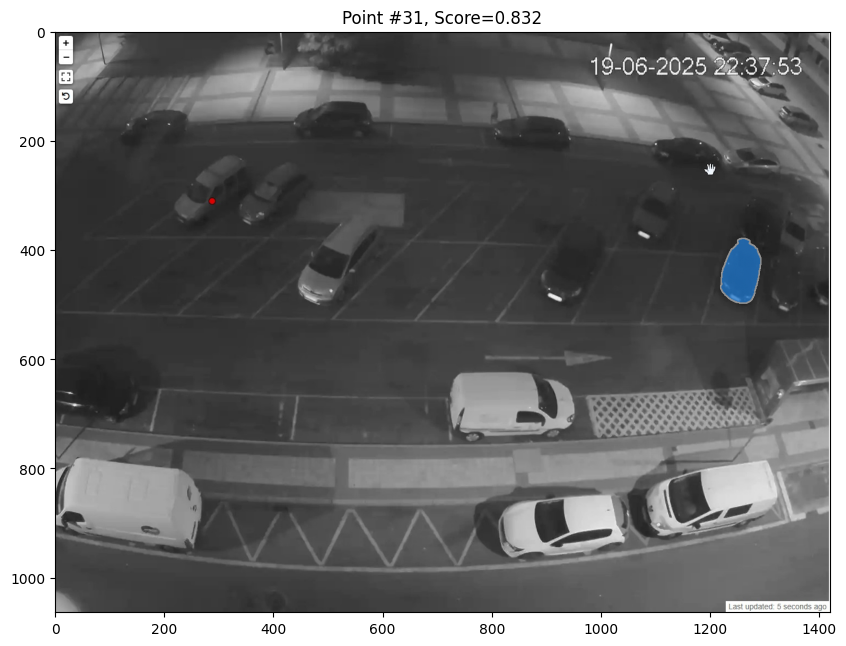

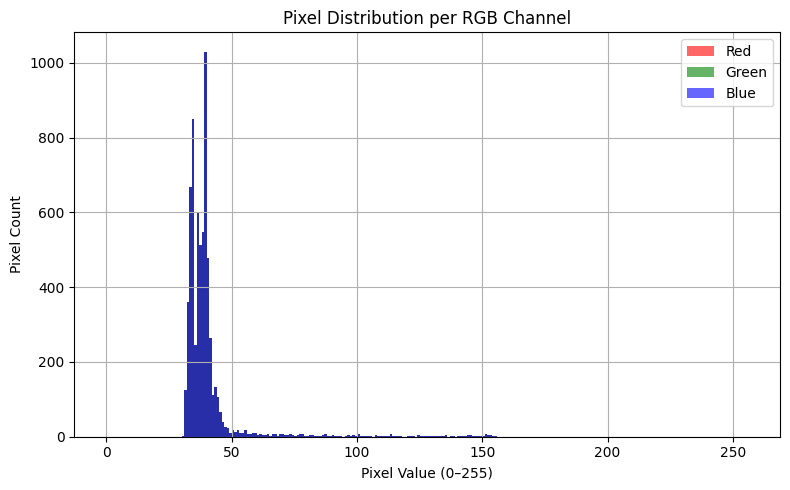

첫 번째 마스크의 픽셀 개수: 5732
첫 번째 마스크의 픽셀 개수: 5732.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(45), np.uint8(45), np.uint8(45)) → 1093 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 1007 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 890 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 406 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(48)) → 377 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 303 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 195 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 191 픽셀
색상 (np.uint8(49), np.uint8(49), np.uint8(49)) → 145 픽셀
색상 (np.uint8(51), np.uint8(51), np.uint8(51)) → 141 픽셀
idx: 32, [O] Occupied Count: 18, Empty Count: 14, slot=C11, Score=0.855, width=60, height=119
idx: 32, [O] Occupied Count: 18, Empty Count: 14, 색상수=108, 채도편차=0.00, 비율=0.50


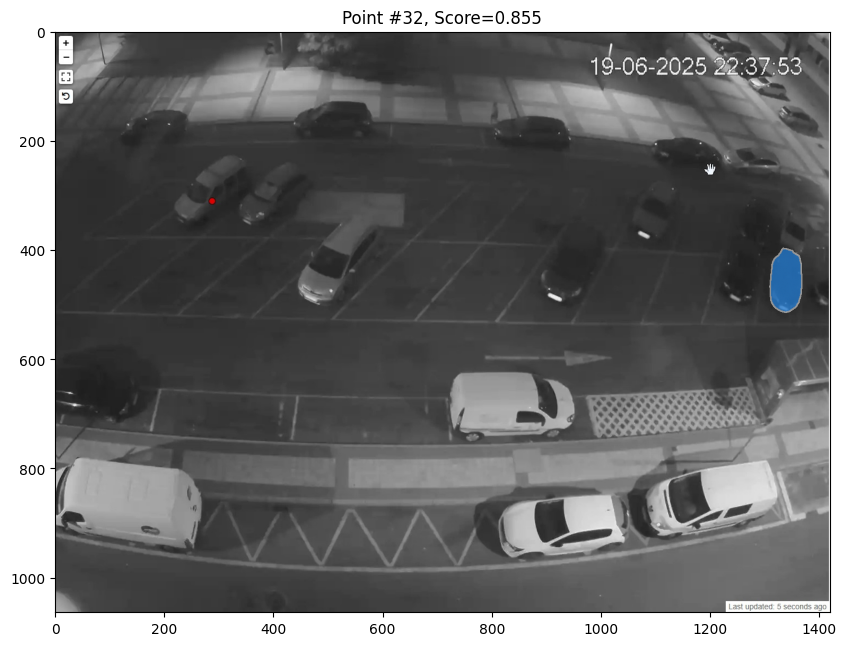

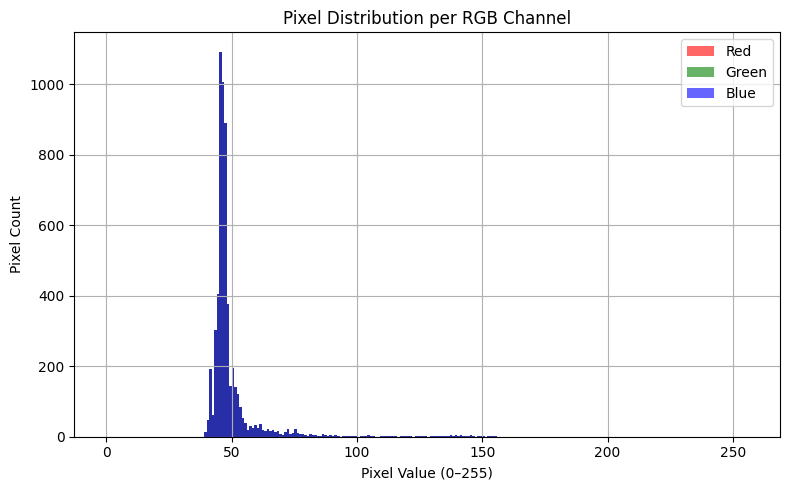

첫 번째 마스크의 픽셀 개수: 1094
첫 번째 마스크의 픽셀 개수: 1094.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(34), np.uint8(34), np.uint8(34)) → 116 픽셀
색상 (np.uint8(36), np.uint8(36), np.uint8(36)) → 72 픽셀
색상 (np.uint8(37), np.uint8(37), np.uint8(37)) → 60 픽셀
색상 (np.uint8(33), np.uint8(33), np.uint8(33)) → 56 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 46 픽셀
색상 (np.uint8(46), np.uint8(46), np.uint8(46)) → 40 픽셀
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 39 픽셀
색상 (np.uint8(50), np.uint8(50), np.uint8(50)) → 38 픽셀
색상 (np.uint8(47), np.uint8(47), np.uint8(47)) → 36 픽셀
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 36 픽셀
idx: 33, [O] Occupied Count: 19, Empty Count: 14, slot=C12, Score=0.840, width=26, height=55
idx: 33, [O] Occupied Count: 19, Empty Count: 14, 색상수=91, 채도편차=0.00, 비율=0.47


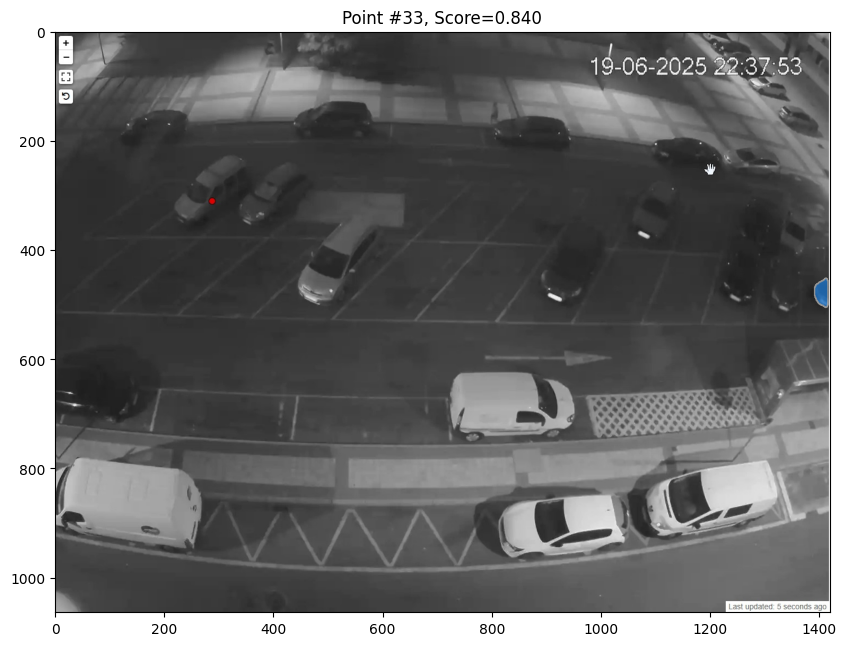

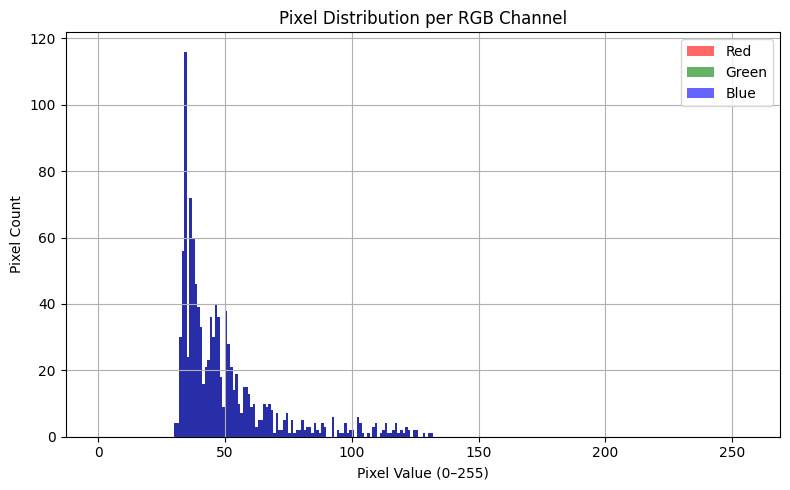

첫 번째 마스크의 픽셀 개수: 19679
첫 번째 마스크의 픽셀 개수: 19679.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(44), np.uint8(44), np.uint8(44)) → 1971 픽셀
색상 (np.uint8(40), np.uint8(40), np.uint8(40)) → 1697 픽셀
색상 (np.uint8(33), np.uint8(33), np.uint8(33)) → 1674 픽셀
색상 (np.uint8(38), np.uint8(38), np.uint8(38)) → 1644 픽셀
색상 (np.uint8(41), np.uint8(41), np.uint8(41)) → 1539 픽셀
색상 (np.uint8(43), np.uint8(43), np.uint8(43)) → 1391 픽셀
색상 (np.uint8(37), np.uint8(37), np.uint8(37)) → 1348 픽셀
색상 (np.uint8(39), np.uint8(39), np.uint8(39)) → 1296 픽셀
색상 (np.uint8(34), np.uint8(34), np.uint8(34)) → 1139 픽셀
색상 (np.uint8(32), np.uint8(32), np.uint8(32)) → 1086 픽셀
idx: 34, [X] Occupied Count: 19, Empty Count: 15, slot=D1, Score=0.785, width=187, height=137, 색상수=162, 채도편차=0.00, 비율=1.36


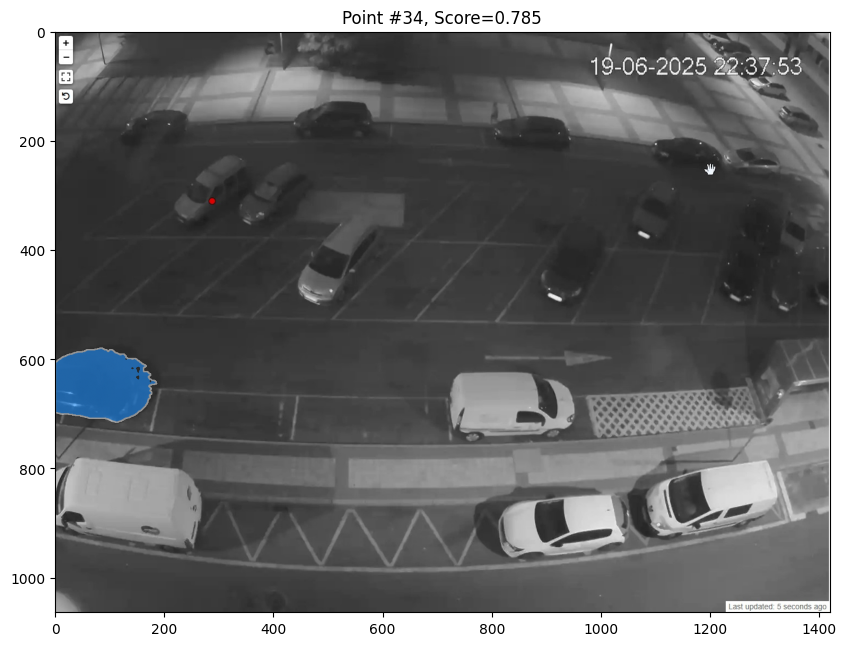

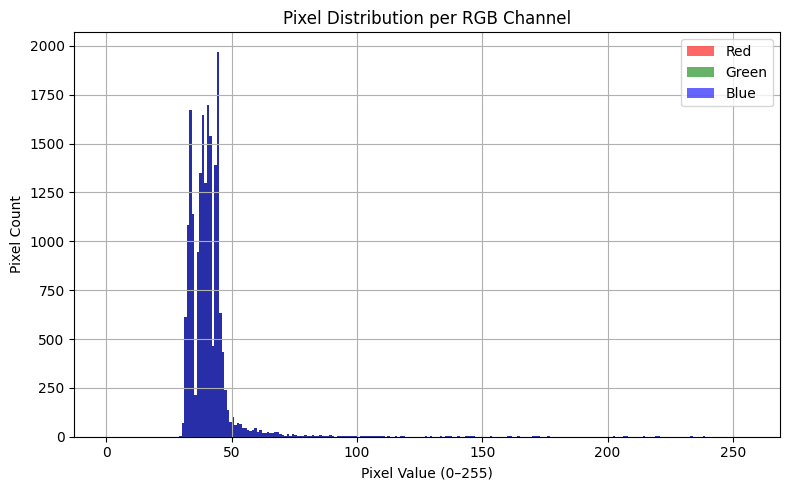

첫 번째 마스크의 픽셀 개수: 43237
첫 번째 마스크의 픽셀 개수: 43237.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(60), np.uint8(60), np.uint8(60)) → 2870 픽셀
색상 (np.uint8(59), np.uint8(59), np.uint8(59)) → 2550 픽셀
색상 (np.uint8(68), np.uint8(68), np.uint8(68)) → 2465 픽셀
색상 (np.uint8(66), np.uint8(66), np.uint8(66)) → 2225 픽셀
색상 (np.uint8(67), np.uint8(67), np.uint8(67)) → 2205 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(58)) → 1797 픽셀
색상 (np.uint8(54), np.uint8(54), np.uint8(54)) → 1793 픽셀
색상 (np.uint8(61), np.uint8(61), np.uint8(61)) → 1775 픽셀
색상 (np.uint8(69), np.uint8(69), np.uint8(69)) → 1715 픽셀
색상 (np.uint8(73), np.uint8(73), np.uint8(73)) → 1636 픽셀
idx: 35, [X] Occupied Count: 19, Empty Count: 16, slot=D2, Score=0.855, width=545, height=99, 색상수=89, 채도편차=0.00, 비율=5.51


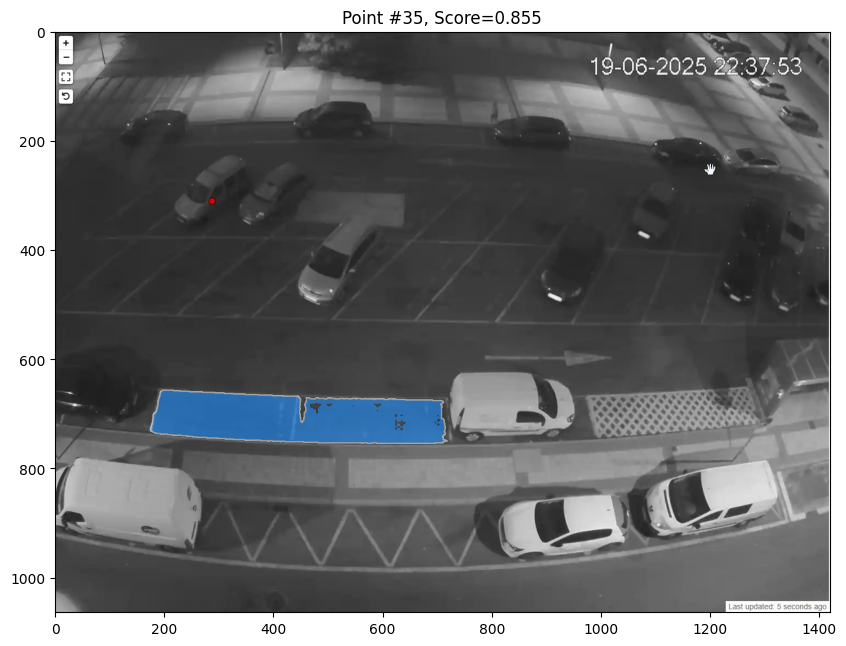

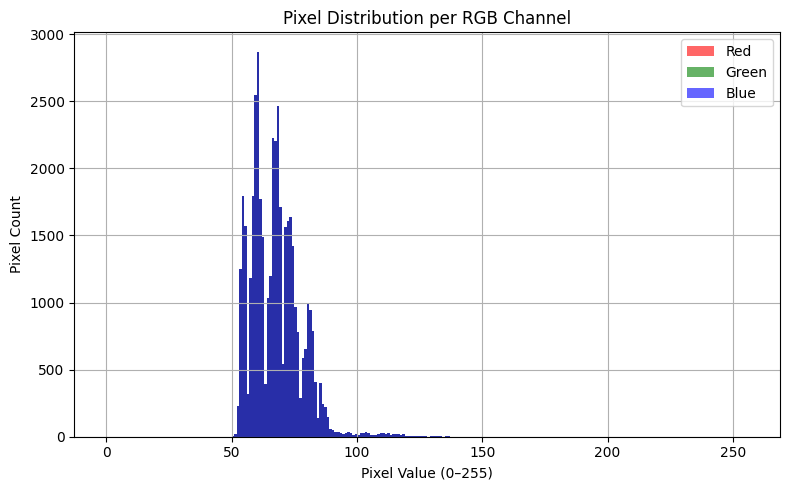

첫 번째 마스크의 픽셀 개수: 23003
첫 번째 마스크의 픽셀 개수: 23003.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(68), np.uint8(68), np.uint8(68)) → 2023 픽셀
색상 (np.uint8(67), np.uint8(67), np.uint8(67)) → 1888 픽셀
색상 (np.uint8(66), np.uint8(66), np.uint8(66)) → 1813 픽셀
색상 (np.uint8(73), np.uint8(73), np.uint8(73)) → 1554 픽셀
색상 (np.uint8(72), np.uint8(72), np.uint8(72)) → 1545 픽셀
색상 (np.uint8(71), np.uint8(71), np.uint8(71)) → 1457 픽셀
색상 (np.uint8(74), np.uint8(74), np.uint8(74)) → 1398 픽셀
색상 (np.uint8(69), np.uint8(69), np.uint8(69)) → 1368 픽셀
색상 (np.uint8(80), np.uint8(80), np.uint8(80)) → 968 픽셀
색상 (np.uint8(75), np.uint8(75), np.uint8(75)) → 928 픽셀
idx: 36, [O] Occupied Count: 20, Empty Count: 16, slot=D3, Score=0.730, width=285, height=88
idx: 36, [O] Occupied Count: 20, Empty Count: 16, 색상수=50, 채도편차=0.00, 비율=3.24


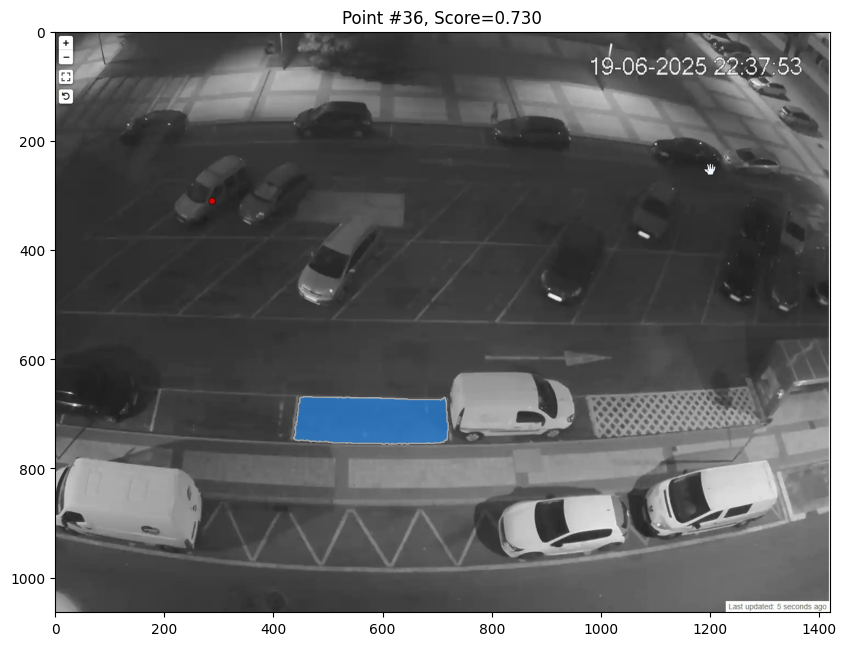

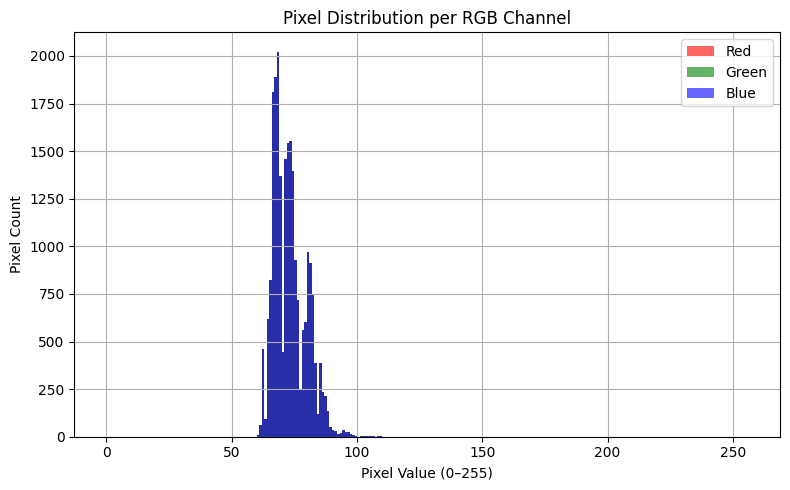

첫 번째 마스크의 픽셀 개수: 25123
첫 번째 마스크의 픽셀 개수: 25123.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(174), np.uint8(174), np.uint8(174)) → 1155 픽셀
색상 (np.uint8(154), np.uint8(154), np.uint8(154)) → 1150 픽셀
색상 (np.uint8(152), np.uint8(152), np.uint8(152)) → 1131 픽셀
색상 (np.uint8(159), np.uint8(159), np.uint8(159)) → 1058 픽셀
색상 (np.uint8(175), np.uint8(175), np.uint8(175)) → 773 픽셀
색상 (np.uint8(173), np.uint8(173), np.uint8(173)) → 765 픽셀
색상 (np.uint8(158), np.uint8(158), np.uint8(158)) → 741 픽셀
색상 (np.uint8(166), np.uint8(166), np.uint8(166)) → 712 픽셀
색상 (np.uint8(167), np.uint8(167), np.uint8(167)) → 651 픽셀
색상 (np.uint8(172), np.uint8(172), np.uint8(172)) → 636 픽셀
idx: 37, [O] Occupied Count: 21, Empty Count: 16, slot=D4, Score=0.977, width=232, height=129
idx: 37, [O] Occupied Count: 21, Empty Count: 16, 색상수=170, 채도편차=0.00, 비율=1.80


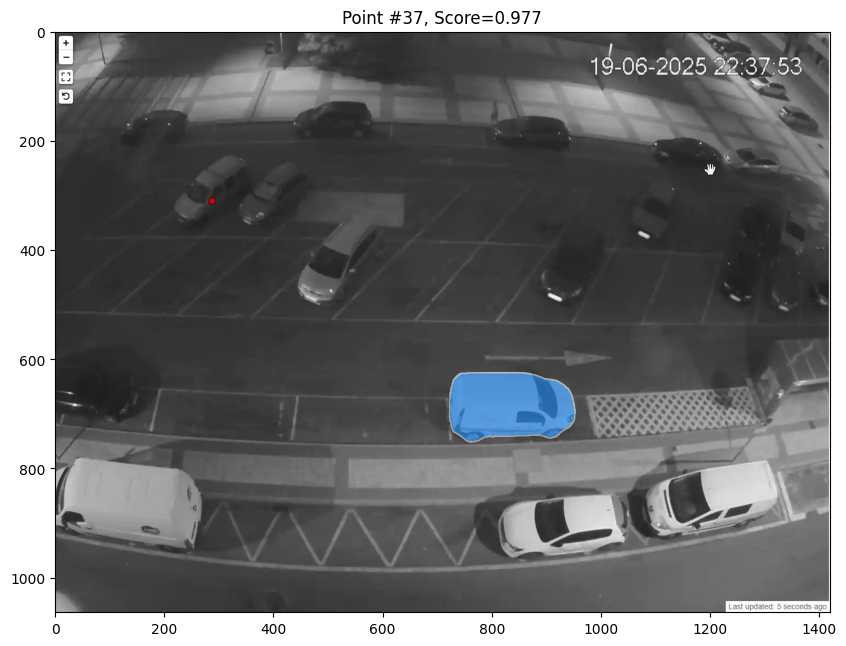

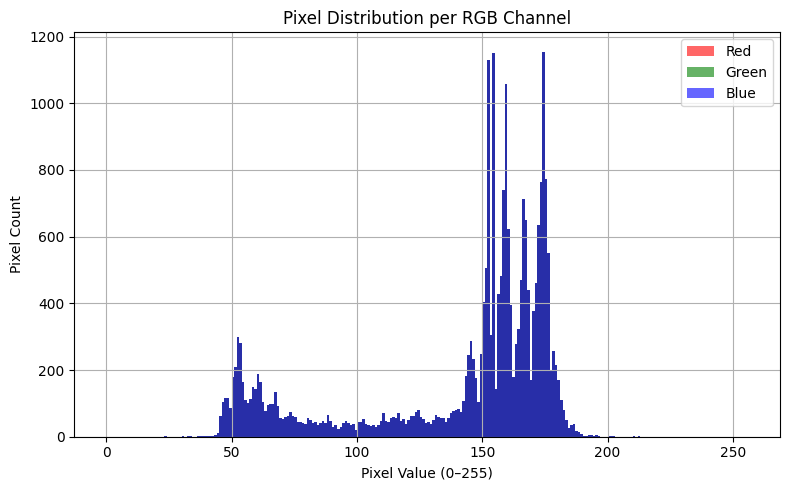

Occupied Count:  21
Empty Count   :  16


In [76]:

occupiedCount = 0 
emptyCount = 0

#                   1      2      3      4      5      6      7      8      9      10     11     12     13     14     15     16     17     18     19     20     21     22     23     24     25     26     27     28     29     30     31     32     33     34     35     36     37     38
#                   A1     A2     A3     A4     A5     A6     A7     A8     A9     B1     B2     B3     B4     B5     B6     B7     B8     B9     B10    B11    B12    C1     C2     C3     C4     C5     C6     C7     C8     C9     C10    C11    C12    D1     D2     D3     D4     D5
lower_thresholds = [3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  1000,  1000,  1000,  1000,  1000,  1000,  1000 ]
upper_thresholds = [15000, 15000, 15000, 15000, 15000, 15000, 15000, 15000, 15000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 30000, 30000, 30000, 30000, 30000]
score_thresholds = [0.7,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6  ]
wh_thresholds    = [0,     0,     0,     0,     0,     0,     0,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     0,     0,     0,     0,     0    ]
slots = (
    [f"A{i}" for i in range(1, 10)] +
    [f"B{i}" for i in range(1, 13)] +
    [f"C{i}" for i in range(1, 13)] +
    [f"D{i}" for i in range(1, 6)]
)


second_point_for = {
    12: [538, 276],  # idx=15(16번째) --> 두 번째 좌표는 [144, 303]
    17: [1020, 303],  # idx=16(17번째) --> 두 번째 좌표는 [ 95, 277]
    #2: [406, 123],  # idx=16(17번째) --> 두 번째 좌표는 [ 95, 277]
}

for idx, pt in enumerate(input_points):
    
    if idx in second_point_for:
        # 첫 번째 좌표: input_points[15] (예: [144, 296])
        # 두 번째 좌표: 예시로 [200, 350] 을 추가 (사용자 상황에 맞춰 바꾸세요)
        first_pt = input_points[idx].tolist()  # 예: [144, 296] 또는 [ 95, 270]
        # 2) 두 번째 좌표는 미리 정의해 둔 값
        second_pt = second_point_for[idx]       # ex: [144, 303] 또는 [95, 277]

        single_point = np.array([first_pt], dtype=np.int32)  # shape = (1, 2)
        single_label = np.array([1], dtype=np.int32)         # (1,)

        # 3) 두 좌표를 합쳐서 (2,2) 모양의 배열로 만든다.
        point_pair = np.array([ first_pt, second_pt ], dtype=np.int32)
        label_pair = np.array([1, 1], dtype=np.int32)  # 둘 다 양성(1)이라고 가정

        # SAM2 predict 호출
        masks, scores, _ = predictor.predict(
            point_coords     = point_pair,
            point_labels     = label_pair,
            multimask_output = False
        )

        # 두 번째 인자로 넘긴 포인트가 두 개이므로, masks와 scores도 각각 길이 2 이상의 배열이 나옵니다.
        # 만약 multimask_output=False로 하면 masks.shape = (2, H, W) 또는 그 이상이 될 수 있으므로,
        # 보통 첫 번째 mask만 써야 한다면 masks[0], scores[0]을 그대로 사용합니다.
        mask_2d    = masks[0]    # 첫 번째 마스크
        score_val  = scores[0] 

        pixel_count = np.count_nonzero(mask_2d)
        pixel_count2 = mask_2d.sum()

        print(f"첫 번째 마스크의 픽셀 개수: {pixel_count}")   # 방법 A 결과
        print(f"첫 번째 마스크의 픽셀 개수: {pixel_count2}")  # 방법 B 결과

        lower = lower_thresholds[idx]
        upper = upper_thresholds[idx]
        # (옵션) score threshold 불러오기
        score_thresh = score_thresholds[idx]

        # 2. 각 RGB 튜플로 변환하여 리스트로 만듦
        rgb_list = [tuple(rgb) for rgb in masked_pixels]  # [(255, 0, 0), (254, 1, 1), ...]

        # 3. 색상 빈도 계산
        color_counts = Counter(rgb_list)

        # 4. 출력 예시: 상위 10개 색상과 개수
        print("🎨 마스크 내 상위 색상 분포:")
        for color, count in color_counts.most_common(10):
            print(f"색상 {color} → {count} 픽셀")

        if score_val >= score_thresh and pixel_count > lower and pixel_count < upper:
            occupiedCount += 1
            print(f"idx: {idx+1}, [O] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}")
        else:
            emptyCount += 1
            print(f"idx: {idx+1}, [X] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}")

    else:
        single_point = np.array([pt])          # (1, 2)
        single_label = np.array([1])           # (1,), 양성(1)

        masks, scores, _ = predictor.predict(
            point_coords     = single_point,
            point_labels     = single_label,
            multimask_output = False
        )
        mask_2d = masks[0]
        score_val = scores[0]

        pixel_count = np.count_nonzero(mask_2d)
        pixel_count2 = mask_2d.sum()

        print(f"첫 번째 마스크의 픽셀 개수: {pixel_count}")   # 방법 A 결과
        print(f"첫 번째 마스크의 픽셀 개수: {pixel_count2}")  # 방법 B 결과

        lower = lower_thresholds[idx]
        upper = upper_thresholds[idx]
        # (옵션) score threshold 불러오기
        score_thresh = score_thresholds[idx]

        ys, xs = np.where(mask_2d > 0)  # or mask_2d == True

        if len(xs) == 0 or len(ys) == 0:
            width = 0
            height = 0
        else:
            x_min, x_max = xs.min(), xs.max()
            y_min, y_max = ys.min(), ys.max()
            width = x_max - x_min + 1
            height = y_max - y_min + 1

        if wh_thresholds[idx] == 1: # 세로 주차
            # 너비와 높이의 비율을 체크
            wh_test = width < 250 and height < 250 and width < height * 2
        else:  # 가로 주차
            wh_test = width < 300 and height < 135 and width > height

        masked_pixels = image_np[mask_2d.astype(bool)]  # shape: (N, 3)
        unique_colors = np.unique(masked_pixels, axis=0)
        color_count = len(unique_colors)

        hsv_pixels = cv2.cvtColor(masked_pixels.reshape(-1, 1, 3), cv2.COLOR_RGB2HSV).reshape(-1, 3)
        saturation_std = hsv_pixels[:, 1].std()

        aspect_ratio = width / height if height != 0 else 0
        y_center = ys.mean() if len(ys) > 0 else 0

        # 2. 각 RGB 튜플로 변환하여 리스트로 만듦
        rgb_list = [tuple(rgb) for rgb in masked_pixels]  # [(255, 0, 0), (254, 1, 1), ...]

        # 3. 색상 빈도 계산
        color_counts = Counter(rgb_list)

        # 4. 출력 예시: 상위 10개 색상과 개수
        print("🎨 마스크 내 상위 색상 분포:")
        for color, count in color_counts.most_common(10):
            print(f"색상 {color} → {count} 픽셀")

        if score_val >= score_thresh and pixel_count > lower and pixel_count < upper and wh_test:
            occupiedCount += 1
            print(f"idx: {idx+1}, [O] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}, slot={slots[idx]}, Score={score_val:.3f}, width={width}, height={height}")
            print(f"idx: {idx+1}, [O] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}, 색상수={color_count}, 채도편차={saturation_std:.2f}, 비율={aspect_ratio:.2f}")
        else:
            emptyCount += 1
            print(f"idx: {idx+1}, [X] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}, slot={slots[idx]}, Score={score_val:.3f}, width={width}, height={height}, 색상수={color_count}, 채도편차={saturation_std:.2f}, 비율={aspect_ratio:.2f}")

    
    # 화면에 띄우는 부분
    plt.figure(figsize=(10, 10))
    #plt.imshow(image)
    plt.imshow(image, cmap='gray')
    show_mask(mask_2d, plt.gca(), random_color=False, borders=True)
    #show_points(single_point, single_label, plt.gca(), marker_size=200)
    plt.title(f"Point #{idx+1}, Score={score_val:.3f}")
    plt.axis('on')
    plt.show()

    masked_pixels = image_np[mask_2d.astype(bool)]  # shape: (N, 3)

    # 채널별로 히스토그램 계산
    colors = ('r', 'g', 'b')
    channel_names = ('Red', 'Green', 'Blue')

    plt.figure(figsize=(8, 5))
    for i, color in enumerate(colors):
        channel_data = masked_pixels[:, i]
        plt.hist(channel_data, bins=256, range=(0, 256), color=color, label=channel_names[i], alpha=0.6)

    plt.title("Pixel Distribution per RGB Channel")
    plt.xlabel("Pixel Value (0–255)")
    plt.ylabel("Pixel Count")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

print(f"Occupied Count:  {occupiedCount}")
print(f"Empty Count   :  {emptyCount}")
